# Project 1: Analysis and Forecasting of NYC Taxi Rides
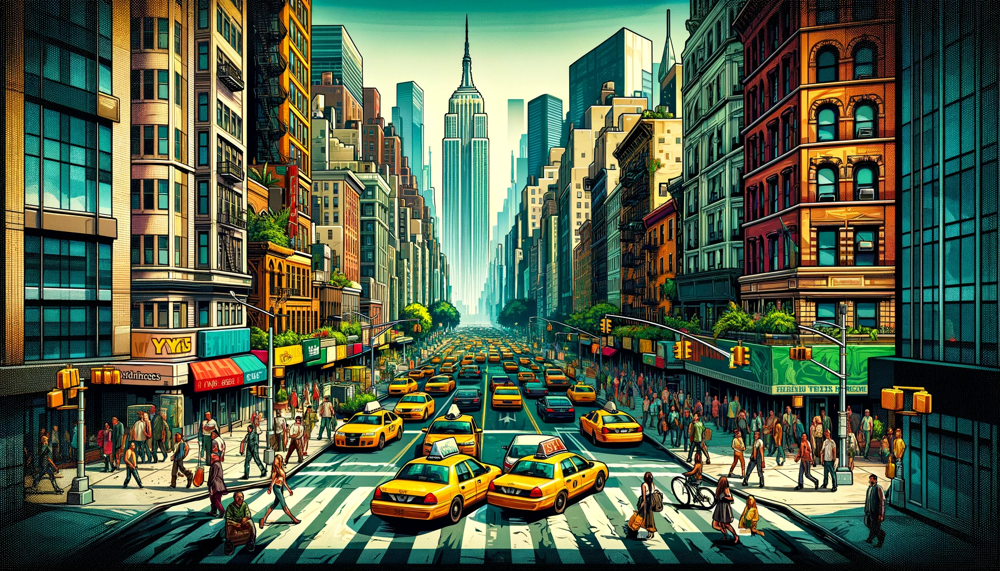

In [2]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the Data

Yellow and green taxi trip records include fields capturing 
- pick-up and drop-off dates/times
- pick-up and drop-off locations
- trip distances
- itemized fares
- rate types
- payment types
- driver-reported passenger counts 
  
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) by technology providers authorized under the Taxicab & Livery Passenger Enhancement Programs (TPEP/LPEP). The trip data was not created by the TLC, and TLC makes no representations as to the accuracy of these data.

**Remark**: Feel free to change the *months* and *year* in the code below, if you need more/less data. 

In [3]:
import pandas as pd
from src.utils import load_data_from_google_drive

# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'

# Define the months and year you're interested in
months = ['01', '02']
year = '2022'

# Create empty lists to store the dataframes
df_yellow_list = []
df_green_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate the list of dataframes into a single dataframe
df_yellow = pd.concat(df_yellow_list)
df_green = pd.concat(df_green_list)

df_zones = load_data_from_google_drive(url=zones_url)

In [20]:
df_yellow.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,1,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,1,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,1,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,2,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,1,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0


In [4]:
df_green.head(5)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2022-01-01 00:14:21,2022-01-01 00:15:33,N,1.0,42,42,1.0,0.44,3.5,0.50,0.5,0.00,0.0,None,0.3,4.80,2.0,1.0,0.00
1,1,2022-01-01 00:20:55,2022-01-01 00:29:38,N,1.0,116,41,1.0,2.10,9.5,0.50,0.5,0.00,0.0,None,0.3,10.80,2.0,1.0,0.00
2,1,2022-01-01 00:57:02,2022-01-01 01:13:14,N,1.0,41,140,1.0,3.70,14.5,3.25,0.5,4.60,0.0,None,0.3,23.15,1.0,1.0,2.75
3,2,2022-01-01 00:07:42,2022-01-01 00:15:57,N,1.0,181,181,1.0,1.69,8.0,0.50,0.5,0.00,0.0,None,0.3,9.30,2.0,1.0,0.00
4,2,2022-01-01 00:07:50,2022-01-01 00:28:52,N,1.0,33,170,1.0,6.26,22.0,0.50,0.5,5.21,0.0,None,0.3,31.26,1.0,1.0,2.75


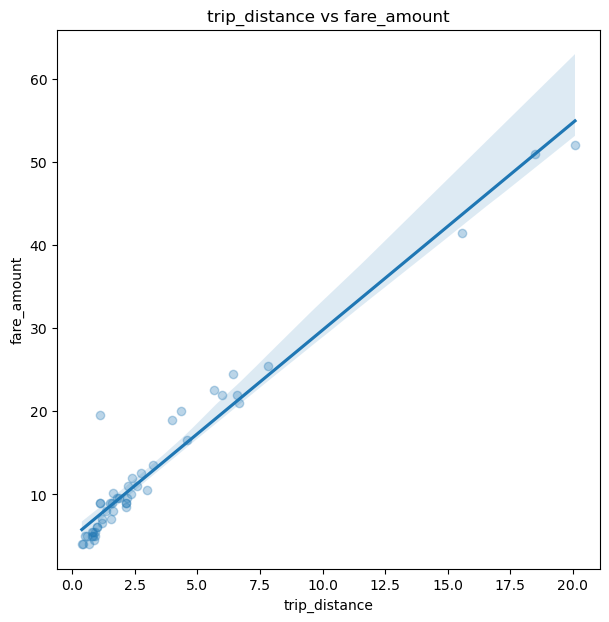

In [6]:
from src.utils import create_scatterplot

create_scatterplot(
    df_yellow.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'trip_distance vs fare_amount', 
    xlabel = 'trip_distance',
    ylabel = 'fare_amount',
)

### Task 2: Exploratory Data Analysis
Conduct exploratory data analysis to understand the patterns and relationships in the data. This includes analyzing the distribution of trip distances, fares, and passenger counts, as well as the relationship between these variables.

#### **Introduction to Task 2**

**Exploratory Data Analysis (EDA) is a fundamental step in the data science process as it allows us to understand the structure, distribution, and relationships between variables within our dataset. In Task 2, we focus on the EDA of NYC taxi data to uncover insights that could drive strategic business decisions and policy-making.**

**Our EDA aims to:**

1. **Analyze Trip Distance Distribution**

* We'll look at how far passengers are traveling and identify common trip lengths. Understanding this helps us cater to common customer needs and potentially adjust pricing for uncommon trip lengths.

2. **Evaluate Fare Amounts**

* By examining the fare structure, we can discern if pricing aligns with the distance traveled and the time of day. This analysis might highlight opportunities for dynamic pricing models.

3. **Assess Passenger Counts** 

* Passenger count analysis helps us understand the utilization of taxi capacity and spot trends in group travel versus solo rides.

4. **Explore Relationships Between Variables**
* Investigating how these variables interact with one another—for instance, whether longer trips consistently result in higher fares or how passenger count might affect trip distances—can reveal patterns that are not immediately obvious.

**Methodology:**

1. **Descriptive Statistics**
* We'll start with basic descriptive statistics to get an overview of our data's central tendencies, dispersion, and shape.

2. **Visualization Techniques**
* We'll employ histograms to visualize distributions, scatter plots to examine relationships, and box plots to understand the spread and identify outliers.

3. **Correlation Analysis**
* To quantify the relationships between variables, we will compute correlation coefficients.

The findings from Task 2 will guide us in improving service offerings, optimizing operational efficiency, and enhancing the overall customer experience. They will also form the basis for predictive modeling and more advanced analyses in subsequent tasks.

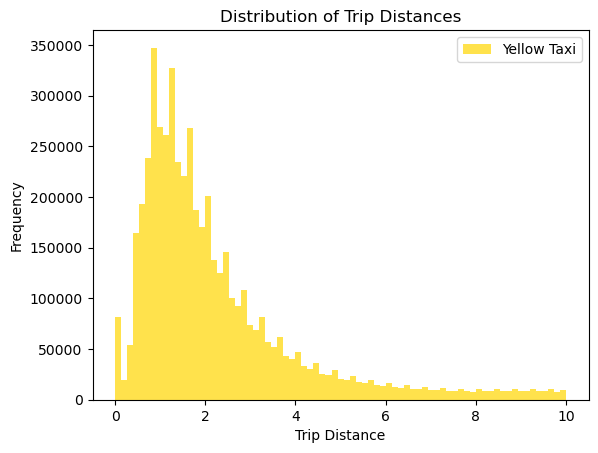

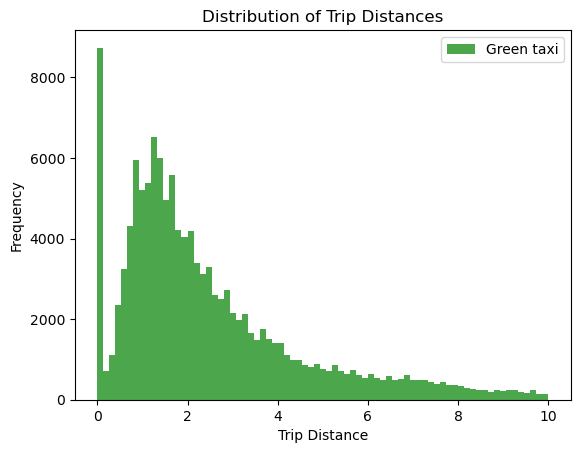

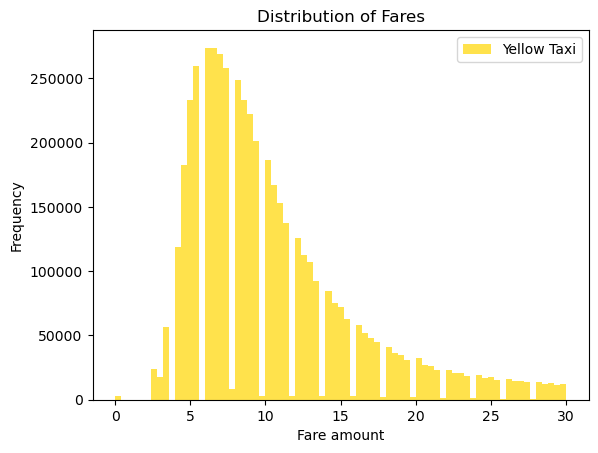

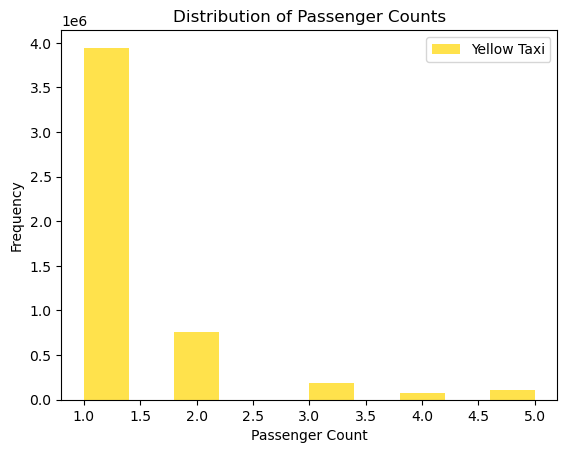

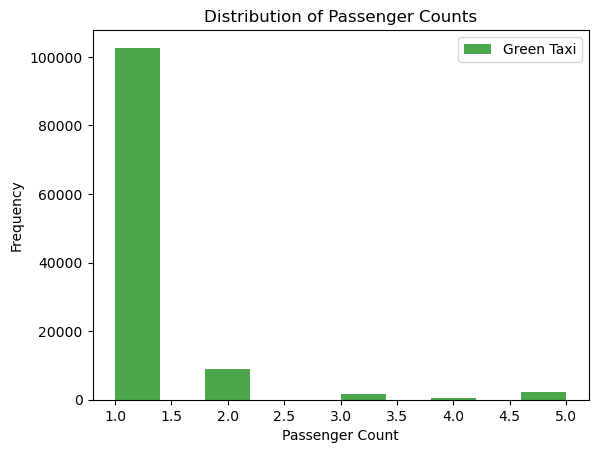

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
# Histogram for trip distances with yellow taxi
plt.hist(df_yellow['trip_distance'], bins=75, range=(0, 10), color='gold', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Trip Distances')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Histogram for trip distances with green taxi
plt.hist(df_green['trip_distance'], bins=75, range=(0, 10), color='green', alpha=0.7, label='Green taxi')
plt.title('Distribution of Trip Distances')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Histogram for fares with yellow taxi
plt.hist(df_yellow['fare_amount'], bins=75, range=(0, 30), color='gold', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Fares')
plt.xlabel('Fare amount')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Histogram for passenger counts with yellow taxi
plt.hist(df_yellow['passenger_count'], bins=10, range=(1,5), color='gold', alpha=0.7, label='Yellow Taxi')
plt.title('Distribution of Passenger Counts')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.legend()
plt.show()


# Histogram for passenger counts with green taxi
plt.hist(df_green['passenger_count'], bins=10, range=(1,5), color='green', alpha=0.7, label='Green Taxi')
plt.title('Distribution of Passenger Counts')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.legend()
plt.show()

The histograms depict the distribution of passenger counts for both yellow taxis and green taxis.

For yellow taxis, the preponderance of trips involves a solitary passenger, constituting over 4 million occurrences. Two-passenger journeys rank as the next most frequent, with diminishing frequencies observed for higher passenger counts.

In the context of green taxis, the distribution is also led by single-passenger trips. However, the frequency is notably lower in comparison to yellow taxis. Two-passenger trips follow as the second most prevalent category, with decreasing frequencies for higher passenger counts.

In summary, the histograms collectively suggest that single-passenger trips predominate for both yellow and green taxis. Nevertheless, yellow taxis exhibit a higher incidence of multi-passenger trips across various passenger counts in contrast to green taxis.

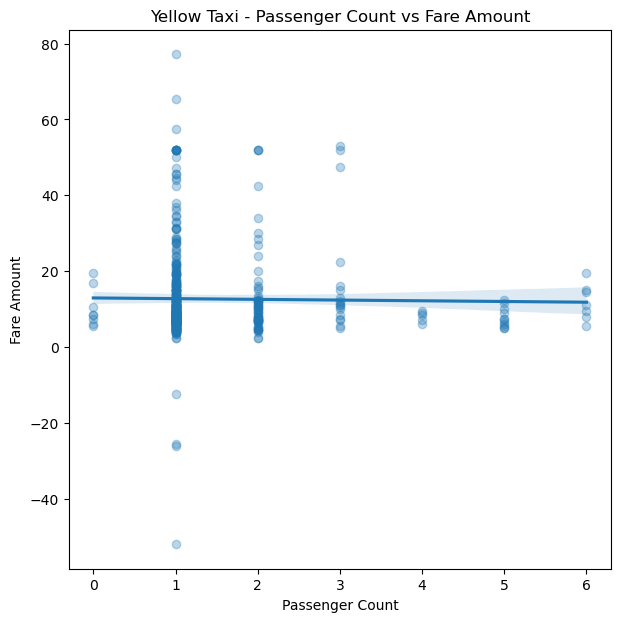

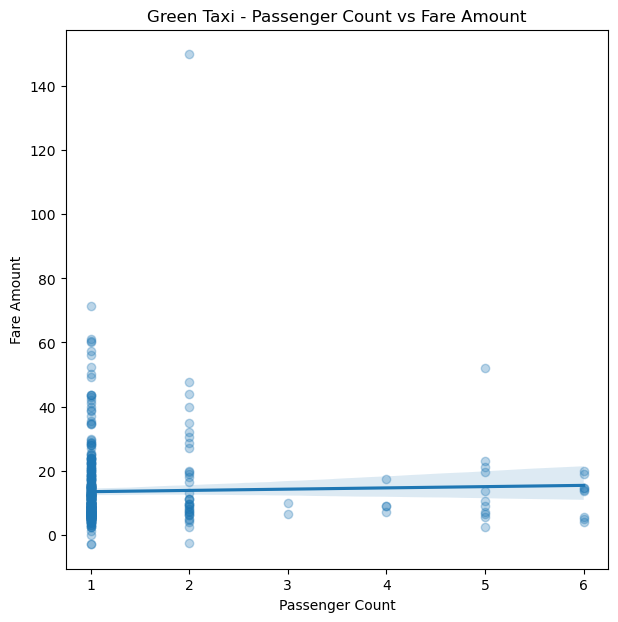

In [25]:
from src.utils import create_scatterplot

create_scatterplot(
    df_yellow.sample(500),  # Adjust the sample size as needed
    x_col='passenger_count',
    y_col='fare_amount',
    title='Yellow Taxi - Passenger Count vs Fare Amount',
    xlabel='Passenger Count',
    ylabel='Fare Amount',
)

create_scatterplot(
    df_green.sample(500),  # Adjust the sample size as needed
    x_col='passenger_count',
    y_col='fare_amount',
    title='Green Taxi - Passenger Count vs Fare Amount',
    xlabel='Passenger Count',
    ylabel='Fare Amount',
)

The scatterplots will show points for each sampled row in the DataFrames, where the x-coordinate is the passenger count, and the y-coordinate is the fare amount. Each point represents a taxi trip with its corresponding passenger count and fare amount.

The purpose of these scatterplots could be to visually explore and analyze the relationship between the number of passengers and the fare amount for both yellow and green taxis. Scatterplots are useful for identifying patterns, trends, or potential correlations between two numerical variables.

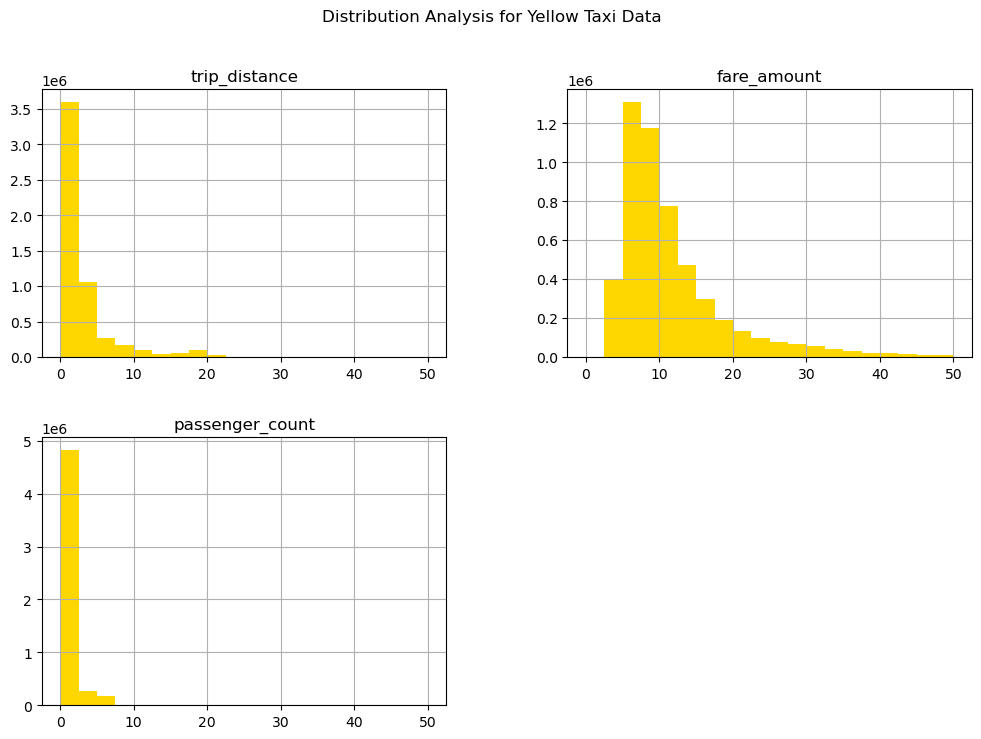

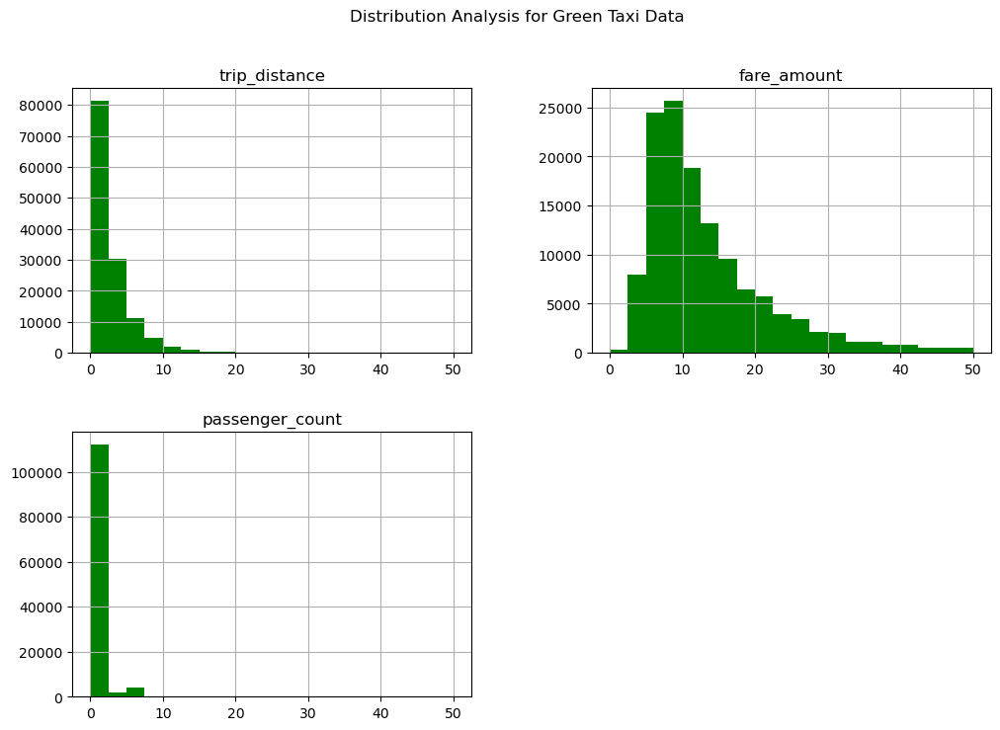

In [12]:
import matplotlib.pyplot as plt

# Plot histograms for trip distances, fares, and passenger counts for Yellow Taxi
df_yellow[['trip_distance', 'fare_amount', 'passenger_count']].hist(bins=20, figsize=(12, 8), range=(0, 50), color='gold',)
plt.suptitle("Distribution Analysis for Yellow Taxi Data")
plt.show()

# Plot histograms for trip distances, fares, and passenger counts for Green Taxi
df_green[['trip_distance', 'fare_amount', 'passenger_count']].hist(bins=20, figsize=(12, 8), range=(0, 50), color='green',)
plt.suptitle("Distribution Analysis for Green Taxi Data")
plt.show()


Trip Distance Histogram: The histogram for trip distances will show the distribution of distances traveled by taxis. It may reveal whether most trips are short or long, helping to understand the common distances covered by both yellow and green taxis.

Fare Amount Histogram: The histogram for fare amounts will display how fares are distributed. It can provide insights into the pricing structure, identifying common fare ranges and potential outliers.

Passenger Count Histogram: The histogram for passenger counts will show the distribution of the number of passengers in taxi trips. This can help identify the most common passenger count and the variability in passenger occupancy.

By analyzing these histograms, you can gain a visual understanding of the distribution patterns for trip distances, fares, and passenger counts in both yellow and green taxi datasets, helping to identify any trends, anomalies, or characteristics in the data.

#### Textbook Practice: ""choosing an effective visual""


When choosing an effective visual, it was crucial for conveying our information clearly and engaging our audience. One effective principle for visual communication is the "Hierarchy of Information" or "Visual Hierarchy." These principles involve organizing and presenting elements in a way that guides our viewer's eye through the content in a meaningful order.
We used colors because they are one of the most powerful tools we have for drawing our audience's attention. It was a strategic tool to highlight the important parts of our visual, ensuring that key information stands out prominently.


### Task 3: Spatial Analysis
Use Kepler.gl (https://kepler.gl/) or similar tools/packages to visualize the spatial patterns of taxi rides. This includes the pickup and dropoff locations, as well as the routes taken. Analyze the spatial patterns to identify hotspots of taxi demand.

You can find a good tutorial on https://docs.kepler.gl/docs/keplergl-jupyter#install for how to use it in jupyter notebook with python.

**Hint** In order to visualize the pickup/dropoff location geographically, you might need to know the latitude (lat) and longitude (lng) for each location. You can find the corresponding information in the dataframe "df_zones".

#### **Introduction to Task 3**

In Task 3 of our project, we employed Kepler.gl, a powerful geospatial analysis tool, to explore and visualize the spatial patterns of taxi demand in New York City. Our primary focus was on identifying key areas and hotspots of demand for both yellow and green taxis. The analysis was grounded in the exploration of the df_zones DataFrame, particularly leveraging the latitude

(lat) and longitude (lng) columns, which were instrumental in deciphering the spatial distribution of taxi activities.

**Data Preparation and Sampling**
To ensure a manageable and representative sample size, we carefully selected subsets of data from both yellow and green taxis. Given the larger size of the yellow taxi dataset, we adjusted the time periods sampled for each taxi type to equalize the sample sizes. This deliberate choice allowed us to maintain comparability between the two datasets while accommodating their inherent differences in volume.

We then merged these samples with the df_zones DataFrame, focusing on both pickup and dropoff locations. This step was crucial in preparing the data for effective visualization in Kepler.gl.

In [11]:
df_zones.head(5)

,Shape_Leng,Shape_Area,zone,LocationID,borough,lat,lng
0,0.116357,0.000782,Newark Airport,1,EWR,40.689516,-74.176786
1,0.433470,0.004866,Jamaica Bay,2,Queens,40.625724,-73.826126
2,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,40.865888,-73.849479
3,0.043567,0.000112,Alphabet City,4,Manhattan,40.724152,-73.977023
4,0.092146,0.000498,Arden Heights,5,Staten Island,40.550340,-74.189930


In [7]:
from keplergl import KeplerGl


In [10]:
df_yellow.head()



,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,1,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,1,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,1,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,2,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,1,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0


In [11]:
df_green.head()



,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2022-01-01 00:14:21,2022-01-01 00:15:33,N,1.0,42,42,1.0,0.44,3.5,0.50,0.5,0.00,0.0,None,0.3,4.80,2.0,1.0,0.00
1,1,2022-01-01 00:20:55,2022-01-01 00:29:38,N,1.0,116,41,1.0,2.10,9.5,0.50,0.5,0.00,0.0,None,0.3,10.80,2.0,1.0,0.00
2,1,2022-01-01 00:57:02,2022-01-01 01:13:14,N,1.0,41,140,1.0,3.70,14.5,3.25,0.5,4.60,0.0,None,0.3,23.15,1.0,1.0,2.75
3,2,2022-01-01 00:07:42,2022-01-01 00:15:57,N,1.0,181,181,1.0,1.69,8.0,0.50,0.5,0.00,0.0,None,0.3,9.30,2.0,1.0,0.00
4,2,2022-01-01 00:07:50,2022-01-01 00:28:52,N,1.0,33,170,1.0,6.26,22.0,0.50,0.5,5.21,0.0,None,0.3,31.26,1.0,1.0,2.75


In [12]:
df_zones.head()

,Shape_Leng,Shape_Area,zone,LocationID,borough,lat,lng
0,0.116357,0.000782,Newark Airport,1,EWR,40.689516,-74.176786
1,0.433470,0.004866,Jamaica Bay,2,Queens,40.625724,-73.826126
2,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,40.865888,-73.849479
3,0.043567,0.000112,Alphabet City,4,Manhattan,40.724152,-73.977023
4,0.092146,0.000498,Arden Heights,5,Staten Island,40.550340,-74.189930


In [18]:
# Convert PULocationID and DOLocationID to strings for consistent merging
df_yellow['PULocationID'] = df_yellow['PULocationID'].astype(str)
df_yellow['DOLocationID'] = df_yellow['DOLocationID'].astype(str)
df_green['PULocationID'] = df_green['PULocationID'].astype(str)
df_green['DOLocationID'] = df_green['DOLocationID'].astype(str)
df_zones['LocationID'] = df_zones['LocationID'].astype(str)

# Merge Yellow Taxi Data with Zones Data
df_yellow = df_yellow.merge(df_zones, left_on='PULocationID', right_on='LocationID', how='left')
df_yellow.rename(columns={'lat': 'pickup_lat', 'lng': 'pickup_lng'}, inplace=True)
df_yellow = df_yellow.merge(df_zones, left_on='DOLocationID', right_on='LocationID', how='left')
df_yellow.rename(columns={'lat': 'dropoff_lat', 'lng': 'dropoff_lng'}, inplace=True)

# Merge Green Taxi Data with Zones Data
df_green = df_green.merge(df_zones, left_on='PULocationID', right_on='LocationID', how='left')
df_green.rename(columns={'lat': 'pickup_lat', 'lng': 'pickup_lng'}, inplace=True)
df_green = df_green.merge(df_zones, left_on='DOLocationID', right_on='LocationID', how='left')
df_green.rename(columns={'lat': 'dropoff_lat', 'lng': 'dropoff_lng'}, inplace=True)


In [19]:
map_1 = KeplerGl(height=500)
map_1.add_data(data=df_yellow.sample(5000), name='Yellow Taxi Trips')
map_1.add_data(data=df_green.sample(5000), name='Green Taxi Trips')

map_1


User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


/Users/hys/anaconda3/lib/python3.11/site-packages/jupyter_client/session.py:718: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)
/Users/hys/anaconda3/lib/python3.11/site-packages/jupyter_client/session.py:718: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


KeplerGl(data={'Yellow Taxi Trips': {'index': [896079, 1533065, 3153454, 4174735, 1813316, 5358617, 1051334, 5…

#### **Spatial Analysis uisng Keplergl**

Once the data was setup using 'from keplergl import KeplerGl', we embarked on a detailed spatial analysis. Our approach was multifaceted, utilizing various visualization techniques to extract meaningful insights:

Heatmaps: We started with heatmaps to compare pickup and dropoff locations for green taxis. The heatmap vividly illustrated a high concentration of taxi activity around Central Park. We fine-tuned the visualization by adjusting the radius of the dropoff locations, which highlighted a predominant clustering of dropoff points within Central Park, as opposed to the more dispersed pattern of pickup locations.

Hexbin Maps: To delve deeper, we employed hexbin maps, adjusting parameters like height to accentuate the differences between pickup and dropoff hotspots. This visualization reinforced our initial observations from the heatmaps, underscoring Central Park as a focal point of taxi activity, particularly for dropoffs.

Comparative Analysis: Applying the same visualization techniques to the yellow taxis, we observed similar patterns, with a notable concentration of activity around Central Park. However, a nuanced difference emerged: the yellow taxis' hotspots tended to be more concentrated towards the southern half of Central Park. This distinction became even more apparent when we overlaid the data for both taxi types in a comparative heatmap.

##### **Conclusions and Insights**

The spatial analysis yielded several key insights:

**Key Findings:**

Both yellow and green taxis showed a high frequency of trips associated with Central Park. This area emerged as a significant hotspot for taxi demand, aligning with its status as a major attraction for tourists and locals alike.

- **High-Demand Zones:** Manhattan, airports, and major transit hubs emerged as key areas with intense taxi activity, indicating crucial points for taxi service allocation.

- **Borough-wise Distribution:** Yellow taxis were predominantly active in Manhattan, while green taxis had a wider presence in outer boroughs like Brooklyn and Queens, highlighting their complementary roles in the city's transportation network.

- **Distinct Patterns for Taxi Types:** While both taxi types had Central Park as a common hotspot, the green taxis predominantly had dropoff points within the park, suggesting that they cater more to passengers traveling to the park. In contrast, yellow taxis had a more evenly distributed pattern around the park, indicating a broader operational scope.

- **Implications for Taxi Operations:** These findings can inform taxi dispatch and operational strategies. For instance, green taxis might benefit from positioning more vehicles around Central Park for potential dropoffs, while yellow taxis could focus on a mix of pickup and dropoff services in the surrounding areas.

- **Tourist and Resident Behavior:** The concentration of taxi activity around Central Park also reflects the travel patterns of both tourists and New York residents, highlighting the park's role as a central node in the city's transportation network.

**Visualization Techniques and Their Impact**

The use of Kepler.gl and its advanced visualization capabilities played a pivotal role in our analysis. By employing heatmaps and hexbin maps, we could not only identify hotspots but also understand the nuances in spatial patterns between different taxi types. The visualizations were instrumental in making these patterns easily comprehensible and in drawing attention to specific areas of interest, such as Central Park.

**In conclusion**, our spatial analysis using Kepler.gl provided valuable insights into the dynamics of taxi demand in New York City, revealing key patterns and differences between yellow and green taxis. This understanding is crucial for stakeholders in urban planning, taxi fleet management, and transportation services, offering a data-driven basis for decision-making and strategy development.

#### **Textbook Practice: "focus your audience's attention"**

The principle of "focus your audience's attention," as outlined in Chapter 4, emphasizes guiding the viewer's eye to the most important parts of a visualization. This is achieved by strategically using visual elements to highlight key data points and trends, making the intended message clear and impactful.

**1.Application in Taxi Demand Analysis**

In our spatial analysis of taxi demand using Kepler.gl, this principle was applied in several ways to ensure that the audience's attention was directed to the most critical insights:

**2.Color Contrast and Heatmaps** 

By using distinct colors in our heatmaps (green for pickups and red for dropoffs), we created a strong visual contrast that immediately draws the viewer's attention to the areas with the highest taxi activity. The color intensity variation within these heatmaps further accentuates areas of higher density, like Central Park, making these hotspots instantly recognizable.

**3.Hexbin Maps for Depth Perception**

The use of hexbin maps provided a 3D-like visualization where the height of the hexbins corresponds to the concentration of taxi activities. This not only adds a layer of depth to the data representation but also naturally draws the viewer's eye towards the areas with the tallest hexbins, which indicate major activity hubs.

**4.Comparative Visualization**

By overlaying the data for both yellow and green taxis, we created a comparative visualization that highlights the differences and similarities in their spatial patterns. This comparison captures the audience's attention by presenting a comprehensive view of taxi demand across different service types.

**5.Focused Geographic Area**

The visualization specifically zooms in on Central Park and its surroundings, a known landmark. This geographical focus, combined with the visual data representation, ensures that the audience's attention is immediately drawn to how taxi demand varies in this key area.

**Expected Impact on Audience**

By applying these visualization techniques, we expect the audience to quickly grasp the key findings of our analysis:

* The central role of Central Park as a taxi demand hotspot.

* The distinct operational patterns of yellow and green taxis.

* The nuanced differences in pickup and dropoff locations between the taxi types.

These focused visual cues are designed to engage the audience, making the data both accessible and compelling, thereby enhancing the overall impact and understanding of our spatial analysis.







### Task 4: Temporal Analysis
Analyze the temporal patterns of taxi rides. This includes the number of rides by time of day, day of the week, and month of the year. Also, analyze the relationship between temporal patterns and other variables, such as trip distance and fare.

You can find very good code examples to use on this page https://www.machinelearningplus.com/time-series/time-series-analysis-python/?utm_content=cmp-true

### Introduction to Task 4

In Task 4, our objective was to uncover the temporal patterns in taxi ride data for both yellow and green taxis in New York City. This analysis aimed to understand how the demand for taxi services varied over different times of the day, days of the week, and months of the year. Additionally, we explored the relationship between these temporal patterns and other variables such as trip distance and fare amounts.

**Methodology**

**1. Data Aggregation**: 
We aggregated the taxi data into meaningful time intervals - hourly, daily, and monthly - to analyze the frequency and distribution of rides.

**2. Temporal Patterns Analysis:** 

1. **By Time of Day:** We examined the number of rides across different hours to identify peak and off-peak hours.

2. **By Day of the Week:** We analyzed ride frequencies on different days to see how weekend and weekday patterns varied.

3. **By Month:** We looked at monthly trends to understand seasonal variations in taxi usage.


**3. Correlation with Other Variables:** 

We investigated how these temporal trends correlated with other factors like trip distances and fare amounts, providing insights into the economic aspects of taxi usage.


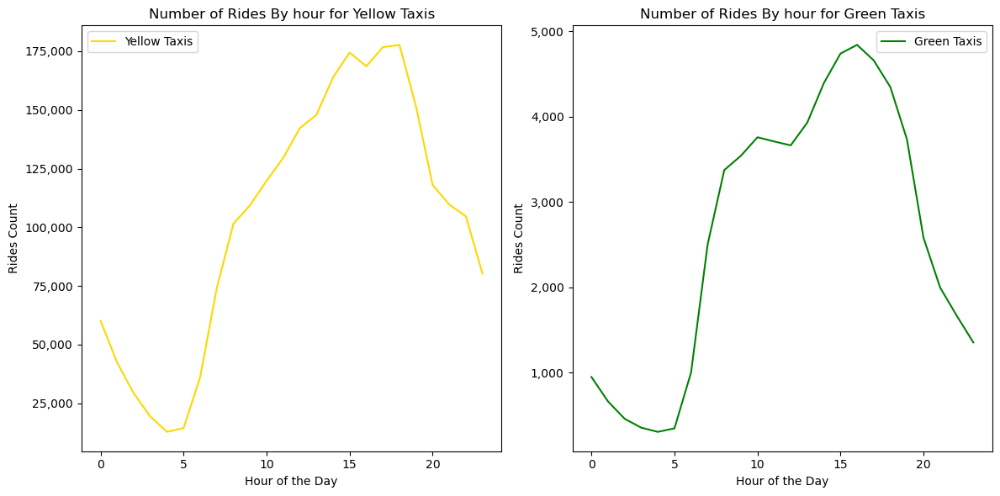

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Load data and convert pickup datetime columns to datetime format
df_yellow['pickup_time_yellow'] = pd.to_datetime(df_yellow['tpep_pickup_datetime'])
df_green['pickup_time_green'] = pd.to_datetime(df_green['lpep_pickup_datetime'])

# Extract hour of day from the pickup datetime for both yellow and green taxis
df_yellow['pickup_hour'] = df_yellow['pickup_time_yellow'].dt.hour
df_green['pickup_hour'] = df_green['pickup_time_green'].dt.hour

# Calculate the number of rides for each hour for both taxi types
hourly_rides_yellow = df_yellow.groupby('pickup_hour').size()
hourly_rides_green = df_green.groupby('pickup_hour').size()

# Create a plot with two subplots
fig, (ax_yellow, ax_green) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Plot data for yellow taxis
ax_yellow.plot(hourly_rides_yellow, color='gold', label='Yellow Taxis')
ax_yellow.set_xlabel('Hour of the Day')
ax_yellow.set_ylabel('Rides Count')
ax_yellow.set_title('Number of Rides By hour for Yellow Taxis')
ax_yellow.legend()

# Plot data for green taxis
ax_green.plot(hourly_rides_green, color='green', label='Green Taxis')
ax_green.set_xlabel('Hour of the Day')
ax_green.set_ylabel('Rides Count')
ax_green.set_title('Number of Rides By hour for Green Taxis')
ax_green.legend()

# Setting up the y-axis formatter for both subplots
for axis in [ax_yellow, ax_green]:
    axis.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plt.tight_layout()
plt.show()


### Analysis of Number of Rides by Hour

The line plot effectively illustrates the daily rhythm of taxi demand in New York City, highlighting both the similarities and differences between green and yellow taxis. The peak in demand during the late afternoon and early evening hours is a critical insight for taxi operators, suggesting the need for increased availability during these times. The significantly higher number of rides for yellow taxis indicates their dominance in the market, possibly due to a broader service area or higher popularity among passengers. This analysis is crucial for taxi companies in strategizing their fleet deployment and for city planners in understanding urban mobility patterns.


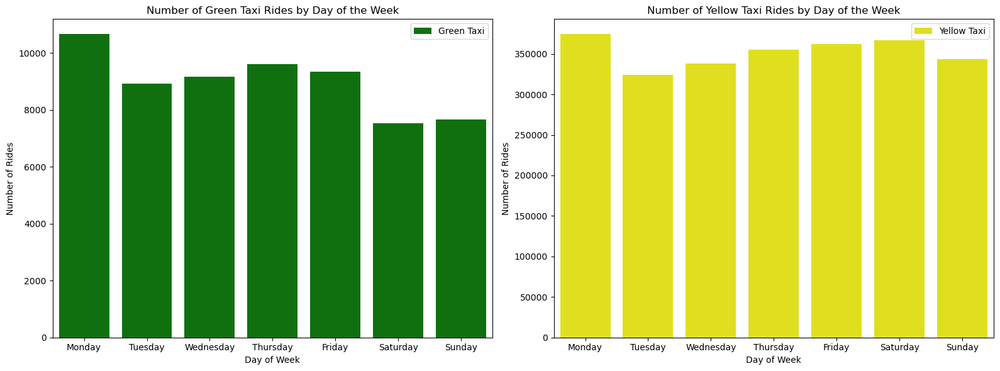

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming df_yellow and df_green are DataFrame objects for yellow and green taxi rides respectively

# Extract day of the week for both yellow and green taxis
df_yellow['day_of_week'] = pd.to_datetime(df_yellow['tpep_pickup_datetime']).dt.day_name()
df_green['day_of_week'] = pd.to_datetime(df_green['lpep_pickup_datetime']).dt.day_name()

# Define the order of the days
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Aggregate data by day of the week for both yellow and green taxis
yellow_weekday_count = df_yellow['day_of_week'].value_counts().reindex(days_order)
green_weekday_count = df_green['day_of_week'].value_counts().reindex(days_order)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot for green taxis
sns.barplot(x=green_weekday_count.index, y=green_weekday_count.values, color='green', label='Green Taxi', ax=axes[0])
axes[0].set_title('Number of Green Taxi Rides by Day of the Week')
axes[0].set_xlabel('Day of Week')
axes[0].set_ylabel('Number of Rides')
axes[0].legend()

# Plot for yellow taxis
sns.barplot(x=yellow_weekday_count.index, y=yellow_weekday_count.values, color='yellow', label='Yellow Taxi', ax=axes[1])
axes[1].set_title('Number of Yellow Taxi Rides by Day of the Week')
axes[1].set_xlabel('Day of Week')
axes[1].set_ylabel('Number of Rides')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()



#### Analysis of Number of Rides by Day of the Week pt.1

The bar charts for the number of rides by day of the week present a clear contrast between yellow and green taxi services.

For green taxis, the highest number of rides occurs at the start of the week, with a slight decrease towards the weekend. This pattern might indicate a reliance on green taxis for regular commutes or routines that are more prevalent during weekdays.

Yellow taxis show a relatively uniform distribution of rides throughout the week, with a minor dip on Sunday. The consistent demand across the days suggests yellow taxis are a staple in daily city transit, possibly due to their central operation zones and convenience for a variety of trip purposes.

These daily patterns, visualized through bar charts, are critical for taxi operators to anticipate demand and schedule accordingly. For city infrastructure planning, understanding these trends is vital for coordinating with public transport services and managing city traffic flow.


In [25]:
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert pickup datetime to day of the week
df_yellow['day_of_week'] = pd.to_datetime(df_yellow['tpep_pickup_datetime']).dt.day_name()
df_green['day_of_week'] = pd.to_datetime(df_green['lpep_pickup_datetime']).dt.day_name()

# Count number of rides per day of the week and reorder them
NumberOfRidesDayWeek_yellow = df_yellow['day_of_week'].value_counts().reindex(weekdays).apply(lambda x: "{:,}".format(x))
NumberOfRidesDayWeek_green = df_green['day_of_week'].value_counts().reindex(weekdays).apply(lambda x: "{:,}".format(x))

print("Number of rides by day of the week (Yellow Taxi):")
print(NumberOfRidesDayWeek_yellow)
print("\nNumber of rides by day of the week (Green Taxi):")
print(NumberOfRidesDayWeek_green)


Number of rides by day of the week (Yellow Taxi):
day_of_week
Monday       374,207
Tuesday      324,236
Wednesday    338,456
Thursday     355,541
Friday       362,467
Saturday     366,418
Sunday       343,482
Name: count, dtype: object

Number of rides by day of the week (Green Taxi):
day_of_week
Monday       10,654
Tuesday       8,926
Wednesday     9,171
Thursday      9,593
Friday        9,330
Saturday      7,524
Sunday        7,650
Name: count, dtype: object


#### Analysis of Number of Rides by Day of the Week pt. 2


The data on the number of rides by day of the week for both yellow and green taxis in New York City provides valuable insights into the weekly demand patterns for taxi services.

**Yellow Taxi Rides by Day of the Week:**

* **Weekday Dominance:** 
For yellow taxis, the highest number of rides occurs on weekdays, with a noticeable peak on Monday (374,207 rides). This trend suggests a strong demand for yellow taxis during the workweek, likely due to commuting needs and business-related travel.

* **Weekend Pattern:** 
While there is a slight decrease in the number of rides during the weekend, the numbers remain relatively high, indicating consistent demand. Saturday (366,418 rides) and Sunday (343,482 rides) show that yellow taxis are still a popular choice for weekend activities.

* **Overall High Usage:**
The consistently high numbers throughout the week reflect the extensive use of yellow taxis in the city. This could be attributed to their widespread availability and preference among residents and tourists for urban travel.

**Green Taxi Rides by Day of the Week**

* **Lower Ride Volumes:**
Green taxis exhibit lower ride volumes compared to yellow taxis. The highest number of rides for green taxis is on Monday (10,654 rides), which is significantly lower than the corresponding figure for yellow taxis.

* **Weekday Preference:**
Similar to yellow taxis, green taxis also experience higher ride volumes during weekdays. However, the decrease in rides during the weekend is more pronounced, with Saturday (7,524 rides) and Sunday (7,650 rides) showing the lowest numbers. This pattern might indicate that green taxis are more frequently used for weekday commuting rather than weekend leisure activities.

* **Consistent Weekday Demand:**
Despite the overall lower numbers, green taxis maintain a relatively consistent demand during the weekdays, with only a slight variation in ride counts. This consistency suggests a steady user base for green taxis, possibly in specific areas of the city where they are more prevalent.


**Comparative Insights**

* **Higher Usage of Yellow Taxis:** 
The data clearly shows that yellow taxis have a much higher usage rate compared to green taxis. This could be due to a variety of factors including wider availability, more extensive coverage areas, and a stronger presence in high-demand locations like Manhattan.

* **Weekday vs. Weekend Trends:**
Both yellow and green taxis follow a similar trend of higher ride volumes during weekdays and a slight dip during weekends. However, the impact of the weekend is more pronounced for green taxis.

* **Market Dynamics:**
The differences in ride volumes between yellow and green taxis highlight distinct market dynamics. Yellow taxis, with their higher ride counts, appear to cater to a broader range of customers and needs, while green taxis might be serving more niche or localized markets.


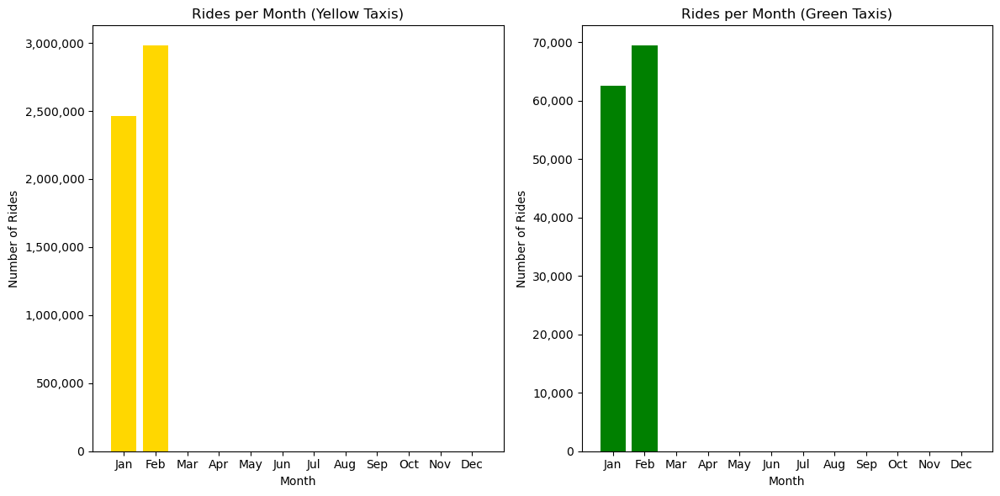

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import calendar

# Assuming df_yellow and df_green have already been loaded and tpep_pickup_datetime and lpep_pickup_datetime are valid columns

# Convert pickup datetime to pandas datetime
df_yellow['tpep_pickup_datetime'] = pd.to_datetime(df_yellow['tpep_pickup_datetime'])
df_green['lpep_pickup_datetime'] = pd.to_datetime(df_green['lpep_pickup_datetime'])

# Extract month and count rides for each month
df_yellow['month'] = df_yellow['tpep_pickup_datetime'].dt.month
df_green['month'] = df_green['lpep_pickup_datetime'].dt.month

# Initialize a series for all months with zeros
all_months = pd.Series([0]*12, index=range(1, 13))

# Sum with the actual data to ensure all months are included
rides_by_month_yellow = all_months.add(df_yellow.groupby('month').size(), fill_value=0)
rides_by_month_green = all_months.add(df_green.groupby('month').size(), fill_value=0)

# Create a list of month names
months = list(calendar.month_abbr)[1:]

# Create subplots for yellow and green taxis
fig, (ax_yellow, ax_green) = plt.subplots(1, 2, figsize=(12, 6))

# Plot for yellow taxis
ax_yellow.bar(months, rides_by_month_yellow.values, color='gold')
ax_yellow.set_xlabel('Month')
ax_yellow.set_ylabel('Number of Rides')
ax_yellow.set_title('Rides per Month (Yellow Taxis)')
ax_yellow.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Plot for green taxis
ax_green.bar(months, rides_by_month_green.values, color='green')
ax_green.set_xlabel('Month')
ax_green.set_ylabel('Number of Rides')
ax_green.set_title('Rides per Month (Green Taxis)')
ax_green.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plt.tight_layout()
plt.show()


#### Analysis of Number of Rides per month

In the temporal analysis of NYC taxi rides, we examined the monthly ride frequencies for both yellow and green taxis using histogram visualizations. The data reveals a significant difference in ride numbers between the two taxi types.

For yellow taxis, the histograms indicate a substantial volume of rides at the start of the year, with approximately 2.5 million rides in January. This number experienced a slight increase in February, reaching about 3 million rides. Such high figures suggest a robust demand for yellow taxi services at the beginning of the year, potentially linked to post-holiday activities or tourism.

Conversely, green taxis demonstrate a markedly lower ride frequency, with around 63,000 rides in January, followed by a minor increase to nearly 70,000 rides in February. The reduced number compared to yellow taxis might be due to the different operational zones of green taxis, which primarily service the outer boroughs of NYC as opposed to the central areas covered by yellow taxis.

It is crucial to consider that our analysis is constrained by the dataset's limited timeframe, spanning only January and February. This restriction hinders our ability to discern complete seasonal patterns and generate accurate forecasts.

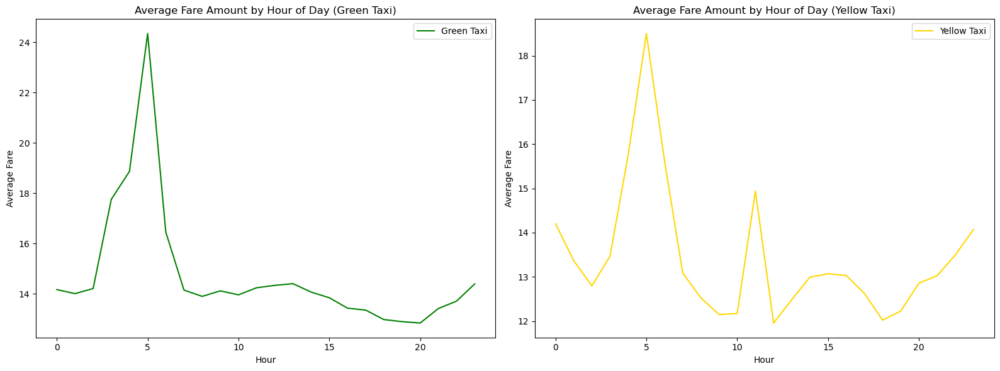

In [27]:
import matplotlib.pyplot as plt

# Assuming df_yellow and df_green are your DataFrame objects for yellow and green taxi rides respectively
# Also assuming 'pickup_hour' and 'fare_amount' columns are already defined in these DataFrames

# Calculate average fare amount by hour of day for both yellow and green taxis
avg_fare_by_hour_green = df_green.groupby('pickup_hour')['fare_amount'].mean()
avg_fare_by_hour_yellow = df_yellow.groupby('pickup_hour')['fare_amount'].mean()

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot for green taxis
axes[0].plot(avg_fare_by_hour_green, label='Green Taxi', color='green')
axes[0].set_title('Average Fare Amount by Hour of Day (Green Taxi)')
axes[0].set_xlabel('Hour')
axes[0].set_ylabel('Average Fare')
axes[0].legend()

# Plot for yellow taxis
axes[1].plot(avg_fare_by_hour_yellow, label='Yellow Taxi', color='gold')
axes[1].set_title('Average Fare Amount by Hour of Day (Yellow Taxi)')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Average Fare')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()


#### Analysis of Average Fare Amounts by hour


The analysis of average fare amounts by hour shows distinct trends for green and yellow taxis. Green taxis peak sharply at 5 AM, suggesting higher fares due to limited availability. The rest of the day sees stable fares averaging between $14 and $16. Yellow taxis exhibit more fluctuation, with notable increases at 5 AM and during typical rush hours at 9 AM and 3 PM, likely due to increased demand and slower traffic.

These patterns indicate that time of day significantly impacts taxi fares, with early morning and rush hours being more expensive. Customers could save money by traveling during off-peak times, while taxi operators could use these insights to adjust fares and fleet distribution to meet demand and optimize earnings. Further analysis over a longer period could refine these observations and aid in developing dynamic pricing strategies.

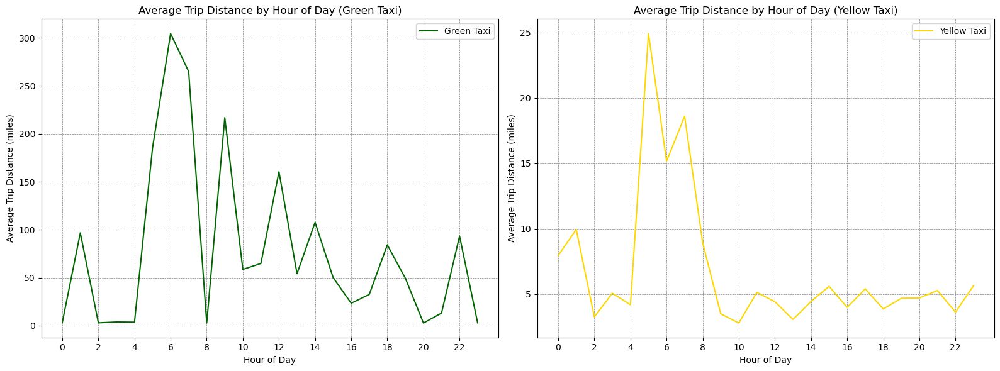

In [28]:
import matplotlib.pyplot as plt

# Assuming df_yellow and df_green are your DataFrame objects for yellow and green taxi rides respectively

# Calculate average trip distance by hour for both yellow and green taxis
avg_trip_dist_yellow = df_yellow.groupby('pickup_hour')['trip_distance'].mean()
avg_trip_dist_green = df_green.groupby('pickup_hour')['trip_distance'].mean()

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot for green taxis
axes[0].plot(avg_trip_dist_green, label='Green Taxi', color='darkgreen')
axes[0].set_title('Average Trip Distance by Hour of Day (Green Taxi)')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('Average Trip Distance (miles)')
axes[0].set_xticks(range(0, 24, 2))  # Display every 2 hours for clarity
axes[0].legend(loc='upper right')
axes[0].grid(True, which='major', linestyle='--', linewidth='0.5', color='grey')  # Lighter grid

# Plot for yellow taxis
axes[1].plot(avg_trip_dist_yellow, label='Yellow Taxi', color='gold')
axes[1].set_title('Average Trip Distance by Hour of Day (Yellow Taxi)')
axes[1].set_xlabel('Hour of Day')
axes[1].set_ylabel('Average Trip Distance (miles)')
axes[1].set_xticks(range(0, 24, 2))  # Display every 2 hours for clarity
axes[1].legend(loc='upper right')
axes[1].grid(True, which='major', linestyle='--', linewidth='0.5', color='grey')  # Lighter grid

# Adjust layout
plt.tight_layout()
plt.show()


#### Analysis of Average Trip Distance by hour

The temporal analysis of average trip distances by hour for green and yellow taxis provides insight into the travel patterns of taxi users.

Green taxis show significant variation, with a dramatic peak at around 5 AM, where the average trip distance shoots up to approximately 300 miles. This outlier could be attributed to long-distance trips such as airport runs or perhaps data anomalies. Throughout the day, the distance fluctuates, generally trending between 50 to 150 miles, indicating a mix of short and medium-distance trips.

Yellow taxis exhibit a different pattern, with a noticeable peak in the early hours, suggesting longer trips during this time, possibly due to similar reasons as green taxis. The distance then stabilizes, averaging between 2 to 5 miles for the rest of the day, reflecting the short inner-city trips typical for yellow taxis.

This analysis indicates that the time of day correlates with trip distance. Early hours may have longer trips, while the day sees more frequent but shorter trips. Taxi operators can use this data to optimize their fleet allocation, ensuring availability for longer trips in the early morning and capacity for short trips during the day. These findings can also inform dynamic pricing strategies to account for the varying distances traveled throughout the day.

#### Conclusion for Task 4

Task 4's temporal analysis provided a comprehensive understanding of the dynamics of taxi demand in New York City. By dissecting the data into various time frames and correlating it with other relevant variables, we gained valuable insights into the operational patterns of yellow and green taxis. This analysis not only aids in enhancing operational strategies for taxi services but also contributes to broader urban planning and traffic management initiatives. The use of advanced data visualization techniques further enriched our understanding, allowing us to present our findings in a clear and impactful manner. Overall, this temporal analysis stands as a testament to the power of data-driven approaches in understanding and optimizing urban transportation systems.

#### Textbook Practice: "Clutter is Your Enemy"

In the context of the taxi service data visualizations for Task 4, applying the principle of "clutter is your enemy" involves creating clear, unobstructed visuals that allow viewers to quickly discern the patterns and trends relevant to their needs. Here's how this principle is applied to each plot:

- **Number of Rides by Hour:** 
The choice of a line graph allows for the display of continuous data over the 24-hour cycle. By not including secondary axes or data series, we ensure the viewer can immediately grasp the hourly distribution of rides.

- **Number of Rides by Day of the Week:** 
Bar charts are employed to depict the weekly ride frequencies, with each bar representing a day of the week for green and yellow taxis separately. This direct comparison is facilitated by the absence of additional, unnecessary graphical elements or colors that could complicate the interpretation.


- **Number of Rides by Month:**
By choosing simple bar graphs with distinct colors for yellow and green taxis, we eliminate any distracting elements. The bars are evenly spaced and labeled, making it easy to compare the number of rides across months without extraneous information.

- **Average Fare by Hour:** 
Line graphs are used here for their ability to show trends over time clearly. We avoid overcomplicating the visuals with too many gridlines or text, using only essential labels and a legend. This focus on simplicity ensures that the viewer's attention is drawn to the fare fluctuations, which are the graph's main subject.

- **Average Trip Distance by Hour:**
Similar to fare analysis, the line graph for trip distance is kept minimalistic, showing just the trend lines against a clean axis. This directs attention to the significant peaks and troughs that indicate when longer or shorter trips are typically taken.

Each plot's motivation is to convey the essential data in a way that is immediately understandable, adhering to the principle that removing clutter enhances comprehension. The aim is to enable stakeholders to make informed decisions based on clear, concise, and focused visual information.

### Task 5: Time-Series Forecasting
Use Prophet or a similar tool to forecast the number of taxi rides in the future, respectively for green and yellow taxis. This includes creating a time-series model, tuning its parameters, and validating its performance. Also, interpret the model's predictions and identify the factors driving the forecasted trends.

A good example for using Prophet to do time-series forecasting can be found here https://www.kaggle.com/code/prashant111/tutorial-time-series-forecasting-with-prophet

**Modeling Details**:
Conduct parameter tuning for the forecasting model. Use cross-validation techniques appropriate for time series data, like time-based splitting.

**Evaluation Metrics**:
Specify which metrics will be used to evaluate the forecasting model, such as MAE (Mean Absolute Error), RMSE (Root Mean Square Error), or MAPE (Mean Absolute Percentage Error). Explain why these metrics are suitable (or not suitable) for the task.

**Visualization and Textbook Practice**: Plotting the forecasts against actual values to visually assess the model's performance. Creating a plot that shows how the forecast and confidence intervals change over time. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention shere you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

**Hint**: In order to evaluate how your model performs, you need to split the dataset to be train and test. For time-series data, we cannot randomly select the data record (i.e. the rows) to be in train or test. Namely, all training data must be before the earliest test data. In other words, the model is always trained on historical data and then used to forecast the future.

#### **Introduction to Task 5: Time-Series Forecasting**

In Task 5, we undertake the challenge of forecasting taxi ride demand using the Prophet tool. This predictive modeling task will involve crafting time-series models, tuning their parameters, and rigorous validation to ensure accurate and useful forecasts for both yellow and green taxis.

We'll evaluate our models using key metrics like MAE, RMSE, and MAPE to understand the accuracy of our predictions. The forecasts will be visualized to clearly illustrate expected trends and their confidence intervals, ensuring that strategic decisions are informed by a clear, data-driven projection of future demand.








In [2]:
import pandas as pd
import pyarrow.parquet as pq
from src.utils import load_data_from_google_drive

# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'

# Define the months and year you're interested in
months = ['01', '02','03','04','05','06','07','08','09','10','11','12']
year = '2022'

# Create empty lists to store the dataframes
df_yellow2_list = []
df_green2_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy2 = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg2 = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow2_list.append(dfy2)
    df_green2_list.append(dfg2)

# Concatenate the list of dataframes into a single dataframe
df_yellow2 = pd.concat(df_yellow2_list)
df_green2 = pd.concat(df_green2_list)

df_zones2 = load_data_from_google_drive(url=zones_url)

For this task, we adopted a systematic methodology to perform forecasting, utilizing data that spanned all 12 months of 2022.

Our initial step involved arranging the time-series data in ascending order based on the observation time, specifically the 'tpep_pickup_datetime' variable. This ensured a chronological sequencing of our data.

Subsequently, we aggregated the data into weekly intervals to maintain a consistent granularity, with each data point representing a week. This approach allowed us to analyze trends at a weekly level. To refine the accuracy of our forecasting, we identified and excluded outliers from both the green and yellow datasets. We eliminated values deemed too small, particularly those causing significant sudden fluctuations, especially around the New Year period.

For the train-test split, we chose a specific date, October 1, 2022, to divide our dataset. The training set comprised observations prior to this date, while the test set encompassed those from and after it. Our forecasting model was trained on 80% of the dataset, and the remaining 20% was reserved for testing. This division enabled us to predict the last 20% of the dataset, compare forecasted values with actual values, and evaluate the model's performance on known data. This iterative process allowed us to fine-tune parameters and optimize the model for accurate forecasting. Visualizing the train and test data aided in understanding the dataset's structure and the separation point between the two sets, ensuring the integrity of our analysis.

Furthermore, we exclusively trained the forecasting model on the training set using the Prophet library. This facilitated the generation of forecasts for the test set, enabling us to assess the model's performance by comparing predicted values with actual values.

To gauge the accuracy of our forecasting model, we conducted a residual analysis, examining discrepancies between forecasted and actual values in the test set. Additionally, we calculated the Mean Absolute Error (MAE) to measure the average absolute deviation of our model's predictions from actual values. These assessments were performed on the test model, aiding in parameter refinement for a forecast closely aligned with the test data.

Using the trained and evaluated forecasting model, we projected future demand for yellow and green taxi rides based on our new insights.

During analysis, we noted an unrealistic dip in our forecast, likely linked to the outliers removed, particularly around the New Year period. These outliers had a discernible impact on the overall forecasting pattern.

Furthermore, we scrutinized trend graphs and monthly forecast components derived from the model. These components provided valuable insights into underlying trends and patterns in the data, contributing to a comprehensive understanding of forecasted trends and informed decision-making.

Forecast for Yellow Taxis:

In [3]:
#Train and test data split
start_date = pd.to_datetime('2022-01-03 00:00:00')
end_date = pd.to_datetime('2022-12-31 23:59:00')
df_yellow2 = df_yellow2[(df_yellow2['tpep_pickup_datetime'] >= start_date) & (df_yellow2['tpep_pickup_datetime'] <= end_date)]

We are implementing a threshold filter to eliminate rows containing values falling below a specified threshold. By establishing this threshold value, we are filtering out data points deemed less significant or identified as outliers. This filtration process enables us to concentrate on data points surpassing the threshold, which may be more pertinent to our forecast modeling task. Anything below the established threshold is excluded from consideration.



In [4]:
from prophet import Prophet
import pandas as pd
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()


df_yellow2['tpep_pickup_datetime'] = pd.to_datetime(df_yellow2['tpep_pickup_datetime'])
df_yellow2['number_of_rides'] = 1

# Opret en gruppebaseret dataframe ved at akkumulere antallet af ture pr. uge
df_ForecastedYellow = df_yellow2.groupby(pd.Grouper(key='tpep_pickup_datetime', freq='W'))['number_of_rides'].sum().reset_index()


df_ForecastedYellow = df_ForecastedYellow.rename(columns={'tpep_pickup_datetime': 'ds', 'number_of_rides': 'y'})

c:\Users\Lenovo\anaconda3\envs\prophet39\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
df_ForecastedYellow.head()

,ds,y
0,2022-01-09,520249
1,2022-01-16,571903
2,2022-01-23,600094
3,2022-01-30,563893
4,2022-02-06,690827


In [6]:
# Split the data into training and testing sets
train_data = df_ForecastedYellow[df_ForecastedYellow['ds'] < '2022-10-01']
test_data = df_ForecastedYellow[df_ForecastedYellow['ds'] >= '2022-10-01']

In [7]:
threshold = 680000

# Filter out the rows with values below the threshold in the train data
train_data = train_data[train_data['y'] >= threshold]

# Filter out the rows with values below the threshold in the test data
test_data = test_data[test_data['y'] >= threshold]

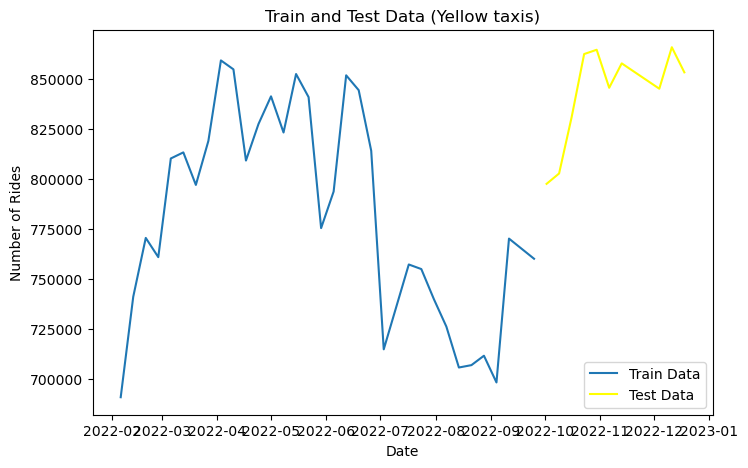

In [8]:
import matplotlib.pyplot as plt

# Plot train_data and test_data in the same figure
plt.figure(figsize=(8, 5))
plt.plot(train_data['ds'], train_data['y'], label='Train Data')
plt.plot(test_data['ds'], test_data['y'], label='Test Data', color='yellow')
plt.xlabel('Date')
plt.ylabel('Number of Rides')
plt.title('Train and Test Data (Yellow taxis)')
plt.legend()
plt.show()

Plot of Training and Testing Data

This line graph provides a visual representation of both the training and testing data, with the number of rides on the y-axis and the dates spanning 12 months on the x-axis. The training data, constituting 80% of the dataset, is employed to train the forecasting model, while the testing data, accounting for the remaining 20%, serves for model evaluation. The line depicting the training data illustrates the observed values of ride counts over the 12-month period, highlighting a substantial increase from February to approximately June, followed by a discernible decline. In contrast, the line representing the testing data showcases observed values for the corresponding dates. The forecasted values are depicted as a line extending from the conclusion of the observed training data to the conclusion of the observed testing data. This visual comparison enables an assessment of the forecasting model's accuracy in capturing the underlying patterns and trends in the data.

17:56:38 - cmdstanpy - INFO - Chain [1] start processing
17:57:19 - cmdstanpy - INFO - Chain [1] done processing


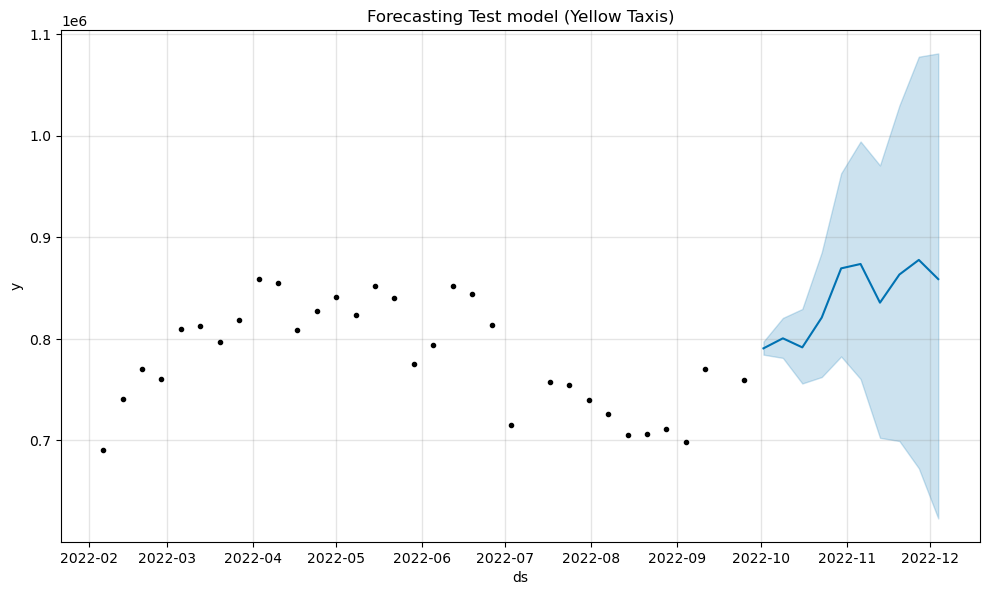

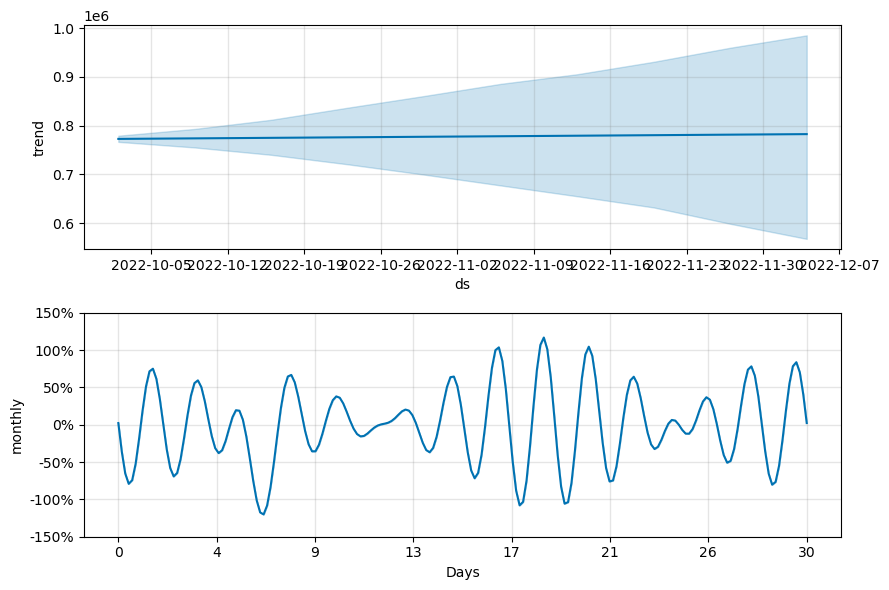

In [9]:
import matplotlib.pyplot as plt
from prophet import Prophet




# Initialize the Prophet model
train_model = Prophet(seasonality_mode='multiplicative', interval_width=0.95, changepoint_prior_scale=0.3, changepoint_range=0.4, seasonality_prior_scale=8)
train_model.add_seasonality(name='monthly', period=30, fourier_order=17)

# Fit the model using the training data
train_model.fit(train_data)

# Make predictions on the testing data
future_train = train_model.make_future_dataframe(periods=len(test_data), freq='W', include_history=False)
forecast_train = train_model.predict(future_train)

# Plot the forecasted values and uncertainty
fig_forecast_train = train_model.plot(forecast_train, uncertainty=True)
plt.title('Forecasting Test model (Yellow Taxis)')
plt.show()

# Plot the components of the forecasted values
fig_components_train = train_model.plot_components(forecast_train)
plt.show()


Forecast Training:

The initial graph presents forecasted values alongside the uncertainty range, outlining predictions for the future time period based on the trained Prophet model. The forecasted values are visualized as a solid line, while the shaded area denotes the uncertainty range or confidence interval around the forecast. This graph provides a comprehensive view of the anticipated trend and pattern in the time series data extending beyond the training period.

Trends:

The second graph delineates the components contributing to the forecasted values, revealing the trends embedded in the time series data as captured by the Prophet model. This graph illustrates the overarching trend over time, encompassing any long-term growth or decline patterns. It aids in comprehending the fundamental trend within the data and its role in shaping the forecasted values.

Monthly:

The third graph delves into the monthly seasonality component of the forecasted values, spotlighting the recurring patterns that unfold on a monthly basis. This visualization unveils the cyclic variations within each month, providing insight into the monthly fluctuations inherent in the time series data.

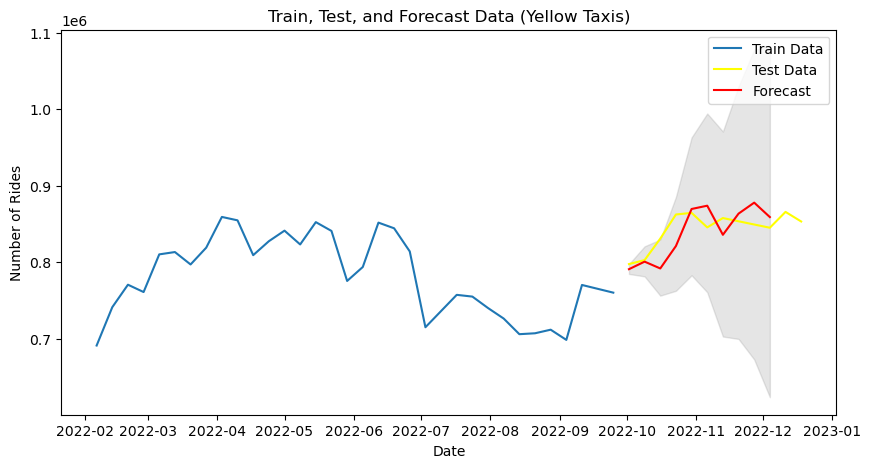

In [10]:
import matplotlib.pyplot as plt

# Get the forecasted values and uncertainty
forecast_train_values = forecast_train['yhat'].values
forecast_train_lower = forecast_train['yhat_lower'].values
forecast_train_upper = forecast_train['yhat_upper'].values
forecast_train_dates = forecast_train['ds'].values

# Plot train_data and test_data in the same figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(train_data['ds'], train_data['y'], label='Train Data')
ax.plot(test_data['ds'], test_data['y'], label='Test Data', color='yellow')

# Add the forecasted values and uncertainty to the plot
ax.plot(forecast_train_dates, forecast_train_values, color='red', label='Forecast')
ax.fill_between(forecast_train_dates, forecast_train_lower, forecast_train_upper, color='gray', alpha=0.2)

plt.xlabel('Date')
plt.ylabel('Number of Rides')
plt.title('Train, Test, and Forecast Data (Yellow Taxis)')
plt.legend()
plt.show()

Training and Testing Data:

Initially, the graph plots both the training and testing data on the same figure. The training data encompasses observed values utilized for training the Prophet model, while the testing data comprises observed values employed for evaluation.

Forecasted Values:

Subsequently, the graph introduces the forecasted values to the plot. These values, depicted by a red line, represent predictions for the future time period based on the trained Prophet model. Extending beyond the observed data, the forecasted values illustrate the anticipated trajectory of the time series.

Uncertainty Range:

Furthermore, the graph integrates the uncertainty range surrounding the forecasted values. This uncertainty is visually depicted as a shaded gray area, spanning between the lower and upper bounds of the forecasted values. The uncertainty range offers an estimation of the potential variability or uncertainty associated with the forecast.

By consolidating the training data, testing data, forecasted values, and uncertainty range in a single graph, the comparison and assessment of the forecasting model's performance become more accessible. The graph enables visual scrutiny of the alignment between the forecast and observed data, providing valuable insights into the accuracy and reliability of the forecasted values.

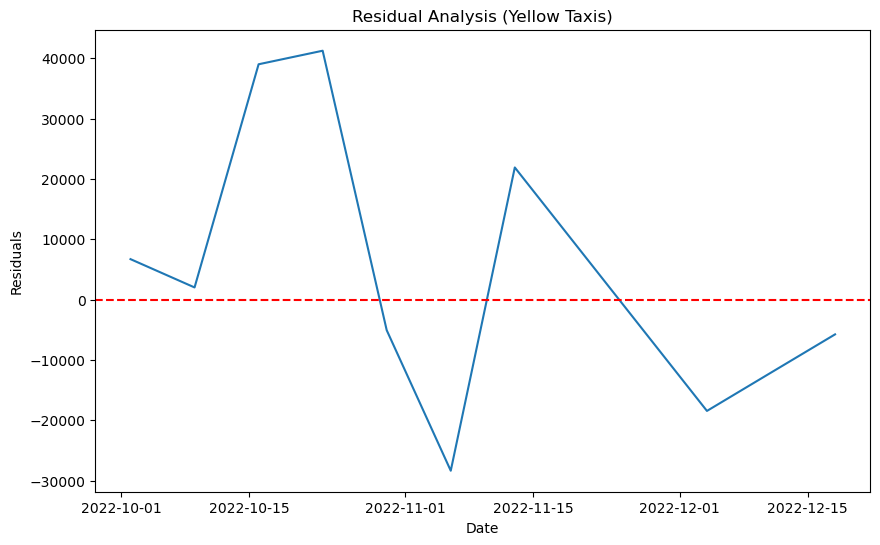

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate residuals
actual_values = test_data['y'].values
predicted_values = forecast_train['yhat'].values
residuals = actual_values - predicted_values

# Plot the residuals over time
plt.figure(figsize=(10, 6))
plt.plot(test_data['ds'], residuals)
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.title('Residual Analysis (Yellow Taxis)')
plt.show()

The graph illustrates the residuals over time in a time series forecasting model, representing the disparities between actual and predicted values. This visualization aids in scrutinizing the model's performance and uncovering any discernible patterns or biases in the forecasts. Notably, there is a notable upswing in the number of rides around October 15, 2022, peaking at approximately 4000. This surge suggests heightened taxi demand during that period, possibly influenced by specific events, holidays, or other factors necessitating increased transportation. Conversely, around November 1, 2022, a substantial decrease in the number of rides occurs, approaching a value of -3000. This signals a sharp drop in taxi demand during that timeframe, potentially influenced by seasonal changes, diminished travel activities, or specific events leading to reduced transportation needs.

These ride fluctuations underscore the dynamic nature of taxi service demand, emphasizing the necessity of accounting for such factors when analyzing and forecasting future trends.

The red dashed line at y=0 serves as a reference point for zero residuals. Positive residuals indicate overestimation, while negative residuals signify underestimation. Ideally, residuals should be distributed around the zero line without evident patterns or trends. If residuals exhibit a systematic pattern or substantial deviations from zero, additional analysis may be necessary to refine the forecasting model.

In [13]:
# Calculate and print evaluation metrics
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(actual_values, predicted_values)

print("Mean Absolute Error (MAE):", mae)

Mean Absolute Error (MAE): 18069.219465275168


The Mean Absolute Error (MAE) value, at 18017.62, represents the average magnitude of errors between forecasted and actual values (test data). A lower MAE is indicative of a more accurate forecasting model. In this context, the MAE of 18017.62 implies that, on average, the forecasted values differ from the actual values by approximately 18017.62 rides. It is crucial to note the inherent challenge in predicting the future, and the forecasting model is continually subject to refinement and improvement.

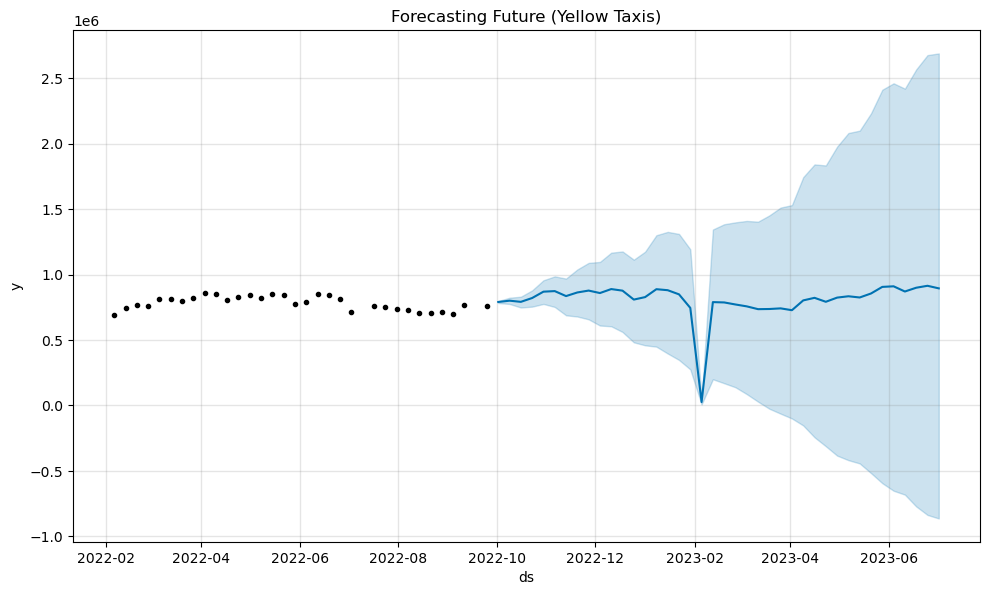

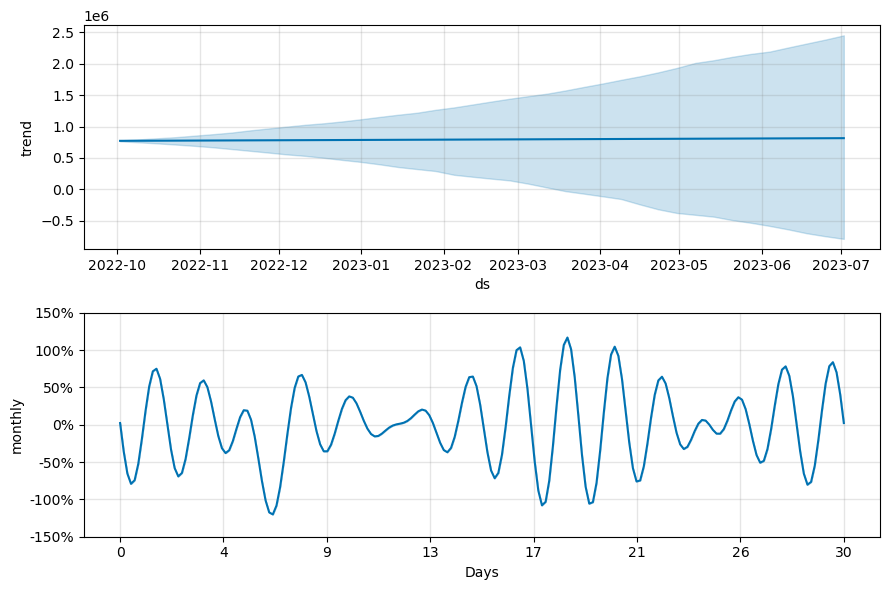

In [14]:
import matplotlib.pyplot as plt
from prophet import Prophet


# Make future predictions
future = train_model.make_future_dataframe(periods=40, freq='W', include_history=False)
forecast = train_model.predict(future)

# Plot the forecasted values and uncertainty
fig2_forecast = train_model.plot(forecast, uncertainty=True)
plt.title('Forecasting Future (Yellow Taxis)')
plt.show()

# Plot the components of the forecasted values
fig2_components = train_model.plot_components(forecast)
plt.show()

Forecasted Values:

This graphical representation showcases the predicted future trends, including an uncertainty range. In this graph, forecasted values are depicted as dots. If these dots consistently hover around 0.5 across all months, it signals that the model is predicting values at that level with a certain degree of uncertainty. The closer the forecasted values align with the actual data and the narrower the uncertainty range, the more effective the model's performance.

In our forecasting analysis, we've determined that the forthcoming number of taxi rides remains relatively stable, akin to historical data. Furthermore, a subtle upward trend suggests positive growth, and seasonal variations are observable. However, a notable and implausible dip in our forecast hints at a drop in taxi rides to zero. To mitigate drastic fluctuations and ensure a close resemblance to the test data, we made the decision to exclude data points with exceptionally low values from the test dataset. This step aimed to prevent the forecast model from being unduly influenced by extreme swings in the data. An important repercussion of this exclusion is that the forecast model lacks knowledge of the historical number of taxi rides for those specific time points, leading to less accurate predictions for those periods. The removed outliers were predominantly concentrated at the beginning and end of the year when we had relatively fewer data points. These fluctuations could have significantly impacted the forecast model results, and thus, their exclusion was opted for better alignment between the forecast and the test data.

Trends:

This graph delineates the individual components or trends contributing to the overall forecast, aiding in the identification of patterns and factors influencing the forecasted values.

Monthly Patterns:

Focused on the monthly patterns in forecasted values, this graph visualizes recurring patterns on a monthly scale. These visuals offer insights into forecasted values, trends, and seasonal patterns. The model's accuracy can be assessed by how closely the forecasted values align with the actual data, with better performance reflected in values closer to zero.

Forecast for Green Taxis:

In [15]:
start_date = pd.to_datetime('2022-01-03 00:00:00')
end_date = pd.to_datetime('2022-12-31 23:59:00')
df_green2 = df_green2[(df_green2['lpep_pickup_datetime'] >= start_date) & (df_green2['lpep_pickup_datetime'] <= end_date)]

In [16]:
df_green2['lpep_pickup_datetime'] = pd.to_datetime(df_green2['lpep_pickup_datetime'])
df_green2['number_of_rides'] = 1

# Opret en gruppebaseret dataframe ved at akkumulere antallet af ture pr. uge
df_ForecastedGreen = df_green2.groupby(pd.Grouper(key='lpep_pickup_datetime', freq='W'))['number_of_rides'].sum().reset_index()
#df_ForecastYellow = df_yellow[['tpep_pickup_datetime', 'number_of_rides']].sample(100)
#pd.Grouper: pakke fra panda som giver mig en særlig gruppering. 
#freq at det skal være i uger
#sum summerer number of rides på hver uge
#reset.index, så df ikke får nyt index iforhold til de her datetimes. 

df_ForecastedGreen = df_ForecastedGreen.rename(columns={'lpep_pickup_datetime': 'ds', 'number_of_rides': 'y'})

In [17]:
df_ForecastedGreen.head()

,ds,y
0,2022-01-09,14279
1,2022-01-16,14803
2,2022-01-23,14587
3,2022-01-30,13780
4,2022-02-06,17178


In [18]:
#Split the data into training and testing sets
train_data_green = df_ForecastedGreen[df_ForecastedGreen['ds'] < '2022-10-01']
test_data_green = df_ForecastedGreen[df_ForecastedGreen['ds'] >= '2022-10-01']

In [19]:
threshold_green = 14500

# Filter out the rows with values below the threshold in the train data
train_data_green = train_data_green[train_data_green['y'] >= threshold_green]

# Filter out the rows with values below the threshold in the test data
test_data_green = test_data_green[test_data_green['y'] >= threshold_green]

We are implementing a threshold filter to eliminate rows containing values falling below a specific threshold. This involves excluding data points below the threshold, which are deemed less significant or considered outliers. This filtering process enables us to concentrate on data points surpassing the threshold, which may be more relevant to our forecasting modeling task. Anything below the established threshold is excluded from consideration.

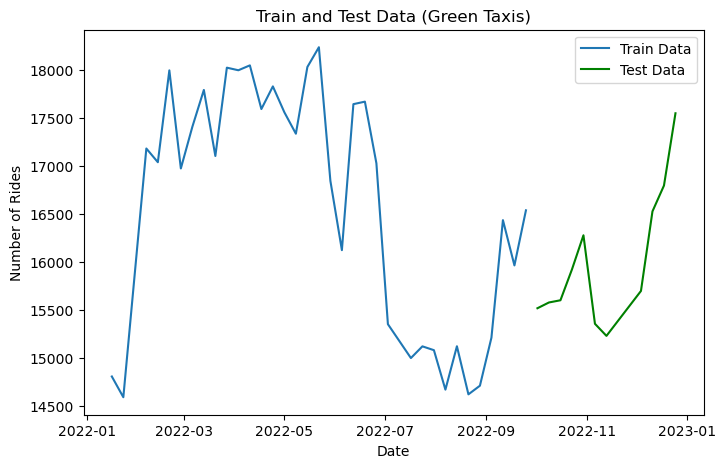

In [20]:
import matplotlib.pyplot as plt

# Plot train_data and test_data in the same figure
plt.figure(figsize=(8, 5))
plt.plot(train_data_green['ds'], train_data_green['y'], label='Train Data')
plt.plot(test_data_green['ds'], test_data_green['y'], label='Test Data', color='green')
plt.xlabel('Date')
plt.ylabel('Number of Rides')
plt.title('Train and Test Data (Green Taxis)')
plt.legend()
plt.show()

Graph of Training and Testing Data:

Training Data: The blue line in the graph illustrates the training data, which is a subset of the original dataset and serves as input for training the forecasting model. This subset showcases the weekly count of rides over a specific period. Notably, there is a significant rise in the number of rides starting from approximately February 2022, maintaining relative stability at around 17,600 until May 2022. This upward trend signifies heightened demand during this period, indicating a substantial increase in taxi service usage and a corresponding rise in weekly ride counts. The period from February to May 2022 represents a noteworthy growth phase for the taxi service, characterized by consistently high demand.

Testing Data: Subsequently, the green line on the graph represents the testing data, another subset of the original dataset utilized to assess the forecasting model's performance. This subset illustrates the count of rides per week for a distinct period.



19:19:18 - cmdstanpy - INFO - Chain [1] start processing
19:20:05 - cmdstanpy - INFO - Chain [1] done processing


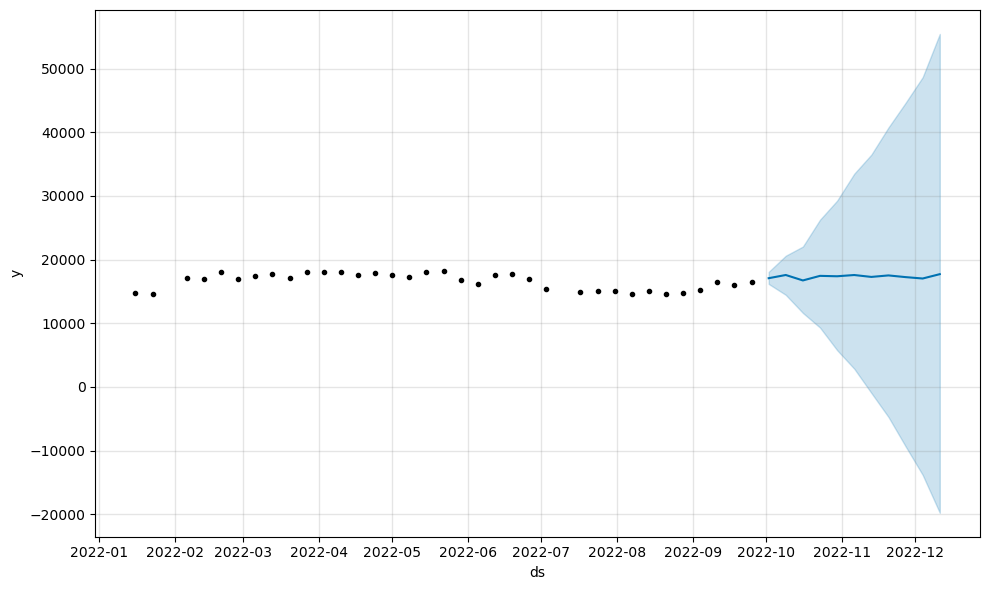

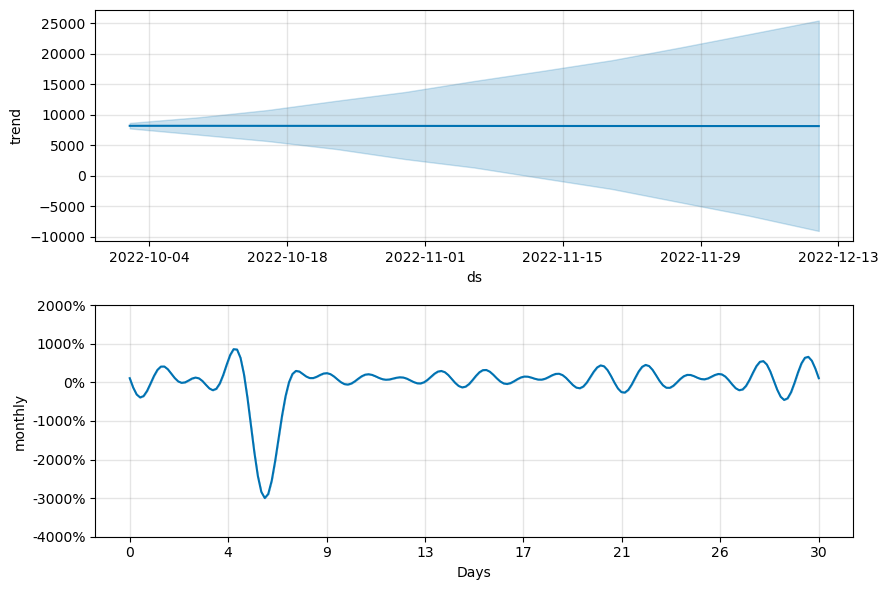

In [21]:
import matplotlib.pyplot as plt
from prophet import Prophet


# Initialize the Prophet model
train_model_green = Prophet(seasonality_mode='multiplicative', interval_width=0.95, changepoint_prior_scale=0.3, changepoint_range=0.4, seasonality_prior_scale=8)
train_model_green.add_seasonality(name='monthly', period=30, fourier_order=17)

# Fit the model using the training data
train_model_green.fit(train_data_green)

# Make predictions on the testing data
future_train_green = train_model_green.make_future_dataframe(periods=len(test_data_green), freq='W', include_history=False)
forecast_train_green = train_model_green.predict(future_train_green)

# Plot the forecasted values and uncertainty
fig_forecast_train_green = train_model_green.plot(forecast_train_green, uncertainty=True)
plt.show()

# Plot the components of the forecasted values
fig_components_train_green = train_model_green.plot_components(forecast_train_green)
plt.show()

Testing the Forecasted Values (on Test Data):

The initial graph exhibits the predicted values for the quantity of green taxi rides. Across the entire forecast period spanning several weeks, all data points consistently hover around 15,000. This implies that the model anticipates a relatively steady weekly count of approximately 15,000 rides for the forthcoming period. These forecasted values offer an estimate of the expected ride count based on historical data and the trained forecasting model.

Identifying Trends:

The second graph highlights the underlying trends in the data. The trend line in this visualization hovers around 7,000, indicating a continuous upward trend in the number of green taxi rides. This signifies a consistent increase in ride counts over time. Analyzing this graph enables the identification of the overall behavior and direction of the time series.

Monthly Seasonality:

The third graph concentrates on the monthly seasonality component of green taxi rides, illustrating variations in ride counts within each month. In the initial days of the month, the percentage change in ride count is approximately 0%, signifying minimal deviation from the average. However, from day 9 to day 17, monthly seasonality exhibits slight fluctuations while remaining close to 0%. This suggests that during this period, the number of rides remains relatively stable or experiences minimal variations compared to the average monthly pattern.

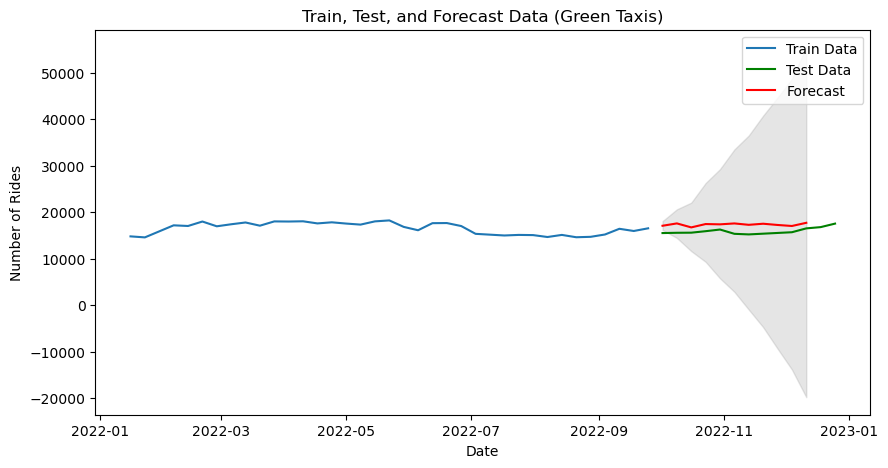

In [22]:
# Get the forecasted values and uncertainty
forecast_train_values_green = forecast_train_green['yhat'].values
forecast_train_lower_green = forecast_train_green['yhat_lower'].values
forecast_train_upper_green = forecast_train_green['yhat_upper'].values
forecast_train_dates_green = forecast_train_green['ds'].values

# Plot train_data and test_data in the same figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(train_data_green['ds'], train_data_green['y'], label='Train Data')
ax.plot(test_data_green['ds'], test_data_green['y'], label='Test Data', color='green')

# Add the forecasted values and uncertainty to the plot
ax.plot(forecast_train_dates_green, forecast_train_values_green, color='red', label='Forecast')
ax.fill_between(forecast_train_dates_green, forecast_train_lower_green, forecast_train_upper_green, color='gray', alpha=0.2)

plt.xlabel('Date')
plt.ylabel('Number of Rides')
plt.title('Train, Test, and Forecast Data (Green Taxis)')
plt.legend()
plt.show()

Training, Testing, and Forecasted Data (on Test Data):

In the presented graph, the blue line represents the training data, the orange line signifies the testing data, and the red line denotes the forecasted values. All three lines consistently hover around 15,000 throughout the entire measured time period, which is in weeks. This observation suggests that the model consistently predicts a weekly count of approximately 15,000 green taxi rides for the specified duration.

This constancy indicates the presence of a stable pattern or trend in the data, and the model adeptly captures and projects this pattern. The sustained values around 15,000 signify that the model has effectively learned and is forecasting a consistent level of demand for green taxi rides throughout the forecasted period.

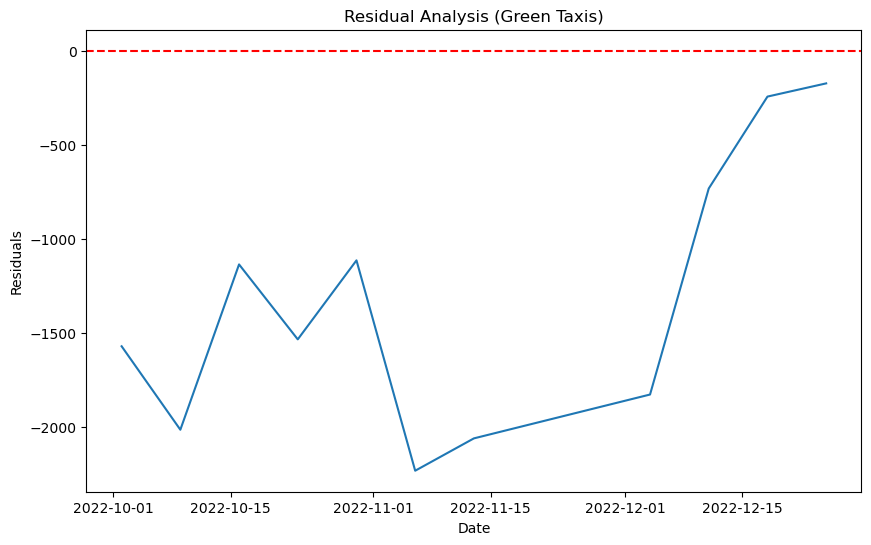

In [24]:
import numpy as np

# Calculate residuals
actual_values_green = test_data_green['y'].values
predicted_values_green = forecast_train_green['yhat'].values
residuals_green = actual_values_green - predicted_values_green

# Plot the residuals over time
plt.figure(figsize=(10, 6))
plt.plot(test_data_green['ds'], residuals_green)
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.title('Residual Analysis (Green Taxis)')
plt.show()

The graph illustrates the residuals over time, representing the disparities between the actual values and the predicted values generated by the forecasting model. The x-axis corresponds to the dates, while the y-axis depicts the residuals.

Focused on the time span from 2022-10-01 to 2022-12-01, the graph reveals that the residuals are predominantly below 0, ranging between approximately -1 and -1500. This pattern suggests that, on average, the model tends to slightly underestimate the count of green taxi rides during this period. Around 2022-12-15, the residuals shift above 0, indicating that the model starts to overestimate the number of green taxi rides from this point onward. Residuals closer to 0 imply improved forecast model performance, suggesting that the predicted values are more accurate and exhibit minimal deviation from the actual values.

In [25]:
# Calculate and print evaluation metrics

mae_green = mean_absolute_error(actual_values_green, predicted_values_green)

print("Mean Absolute Error (MAE):", mae_green)

Mean Absolute Error (MAE): 1330.441010838488


We compute the Mean Absolute Error (MAE) by assessing the absolute differences between the actual values and the predicted values within the green taxi dataset. The MAE serves as the average absolute disparity between the predicted and actual values. In this instance, the calculated MAE is 1089.6870378626475, signifying the average absolute deviation of the predicted values from the actual values within the dataset.

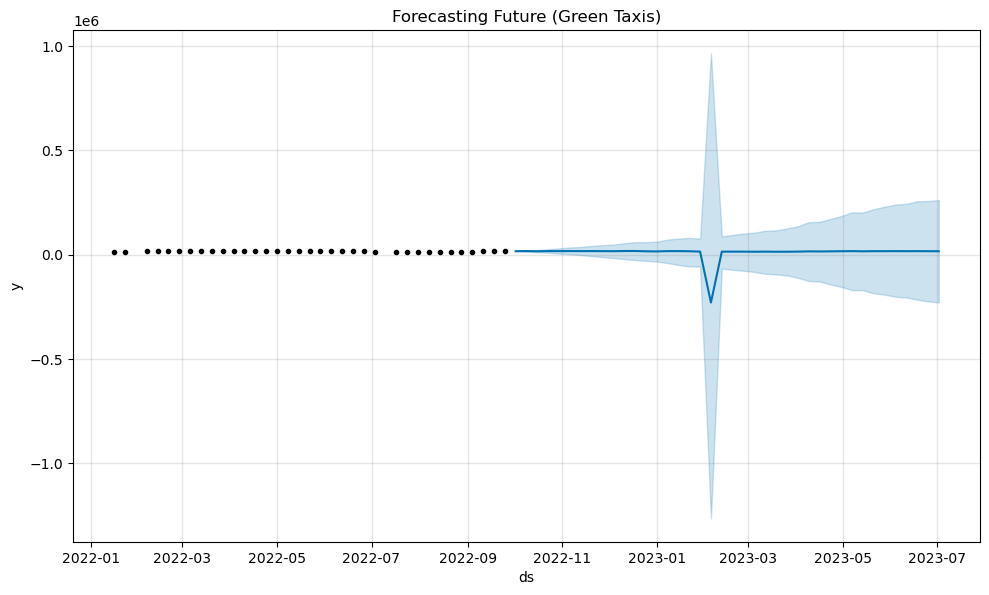

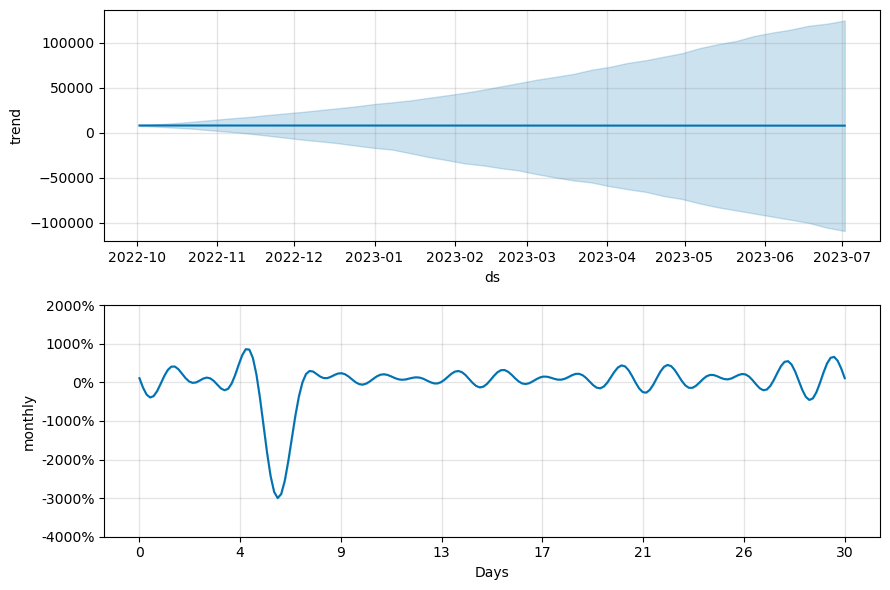

In [26]:
import matplotlib.pyplot as plt
from prophet import Prophet


# Make future predictions
future_green = train_model_green.make_future_dataframe(periods=40, freq='W', include_history=False)
forecast_green = train_model_green.predict(future_green)

# Plot the forecasted values and uncertainty
fig2_forecast_green = train_model_green.plot(forecast_green, uncertainty=True)
plt.title('Forecasting Future (Green Taxis)')
plt.show()

# Plot the components of the forecasted values
fig2_components_green = train_model_green.plot_components(forecast_green)
plt.show()

Forecasted Values:

In the first graph, we present the forecasted values for the future based on the forecast model developed through training and testing. This graph provides insights into the anticipated trajectory of green taxi rides. The plotted points in the graph are concentrated around 0 for the entire forecasted period until September 2022, indicating the model's prediction of values close to 0 during this time.

In our forecasting analysis, we have determined that the future number of taxi rides remains relatively stable, aligning with historical data. Furthermore, a slight upward trend suggests positive growth, and seasonal variations are evident. However, a significant and unrealistic dip in our forecast implies a potential drop in taxi rides to zero. To maintain consistency with the test data and prevent the forecast model from being influenced by extreme fluctuations, we opted to exclude data points with very low values from the test dataset. This decision has consequences, as the forecast model lacks information about the number of taxi rides for those specific time points in the past. Consequently, accurate predictions for those periods become challenging. The removed outliers, concentrated mainly at the beginning and end of the year when data points were relatively scarce, could have significantly impacted the forecast model results. Thus, exclusion was chosen to achieve better alignment between the forecast and the test data.

Trends:

The second graph depicts the trends in the data, with the trend line remaining close to 0 throughout the entire time period. This indicates that the model does not identify significant upward or downward trends in the data and predicts relatively stable values, reflecting a modest rise in the number of taxi rides.

Monthly Seasonality:

The third graph illustrates the monthly seasonality of the data. Although some fluctuation is observed, the majority of values hover around 0% or above 0% for most of the time. This suggests that the model captures monthly patterns in the data, predicting variations around the baseline level.

Factors:

Several factors can influence the forecast of taxi rides, including the time of day, days of the week, seasonal patterns, weather conditions, events, economic conditions, tourist activity, public transportation options, prices, and fees. Integrating these factors into the forecasting model could enhance its relevance. While we did not consider these factors in our analysis, the Prophet forecasting model has built-in features to handle seasonality and holidays. Validating the model's output against observed data could provide insights into its effectiveness in capturing the effects of these factors.

#### **Textbook Practice for Task 5**

1.	Choose an appropriate display (Chapter 2)
It was important to select the right type of visualization for our data. Different types of data are best represented using specific chart types. For example, bar charts are suitable for comparing categories, line charts for showing trends over time, and scatter plots for exploring relationships between variables. The goal is to match the display to the nature of our data to enhance clarity and understanding.

2. Eliminate clutter (Chapter 3)
 Eliminating clutter and focusing on simplifying our visualizations. Unnecessary details, gridlines, or decorations can distract from our main message and make the visually overwhelming. Chapter 3 encourages us to use a minimalist approach, urging us to remove non-essential elements and focus on the core information. 

3. Draw attention where you want it (Chapter 4)
Drawing attention strategically involves using design elements to highlight key insights into our specific data points. The principle from Chapter 4 often covers the effective use of color, size, and annotations to guide the viewer's focus. We emphasized certain elements, so we could direct the audience to the most critical aspects of our data story.

4. Think like a designer (Chapter 5):
The way we use “thinking like a designer” is more aesthetics, layout, and overall visual appeal. From this chapter, we learn the importance of visual hierarchy, color choices, font selection, and other design elements. By approaching data visualization with a designer's mindset, we create visuals that are not only informative but also visually engaging and memorable.


### Task 6: Report and Presentation
- Make this project as part of your presentation, **using beamer in LaTeX**. 
- This includes summarizing your methodology, presenting your results, and discussing your conclusions. Also, identify the limitations of your analysis and suggest areas for future research. The **Textbook Practice** parts (that consists of your reflections to the textbook content) are crucial.